# Ross Sea synthetic gravity inversion

import packages

In [1]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import copy
import logging
import os
import pathlib
import pickle
import string
import copy
import numpy as np
import scipy as sp
import verde as vd
import xarray as xr
from polartoolkit import maps, profiles
from polartoolkit import utils as polar_utils

import RIS_gravity_inversion.plotting as RIS_plotting
import RIS_gravity_inversion.synthetic as RIS_synth

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import inversion, optimization, plotting, regional, uncertainty, utils

# Get synthetic model data

INFO:root:converting to be reference to the WGS84 ellipsoid
INFO:root:spacing larger than original, filtering and resampling
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


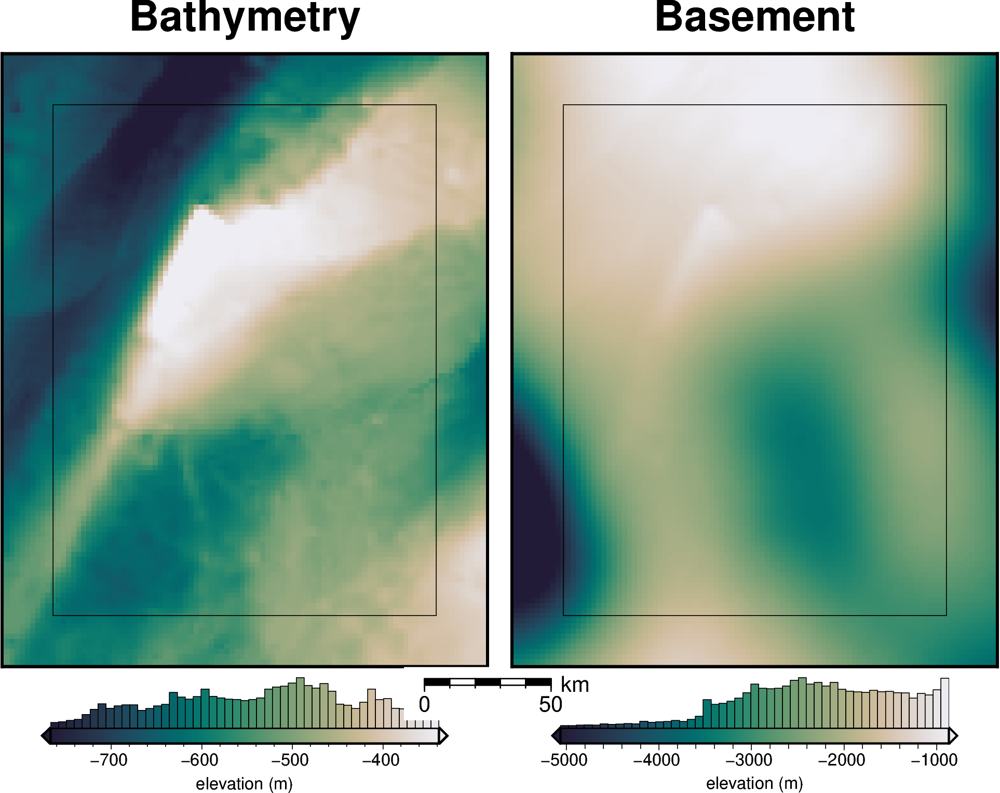

  0%|          | 0/7676 [00:00<?, ?it/s]

  0%|          | 0/7676 [00:00<?, ?it/s]

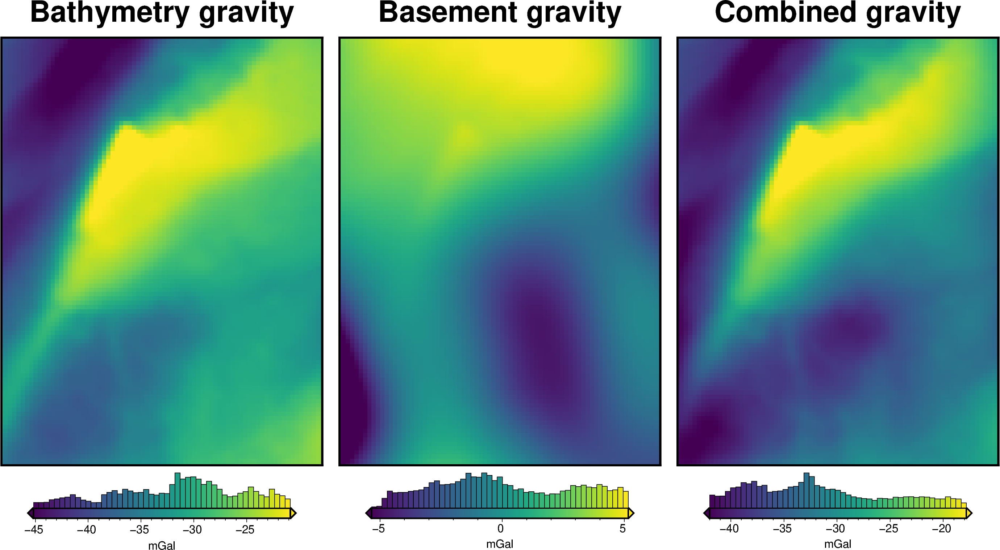

In [2]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, grav_df = RIS_synth.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    basement=True,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

In [3]:
# normalize regional gravity between -1 and 1
grav_df["basement_grav_normalized"] = (
    vd.grid_to_table(
        utils.normalize_xarray(
            grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav,
            low=-1,
            high=1,
        )
    )
    .reset_index()
    .basement_grav
)
grav_df = grav_df.drop(columns=["basement_grav", "disturbance", "gravity_anomaly"])

In [4]:
# re-scale the regional gravity
regional_grav = utils.normalize_xarray(
    grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav_normalized,
    low=0,
    high=50,
).rename("basement_grav")
regional_grav -= regional_grav.mean()

# add to dataframe
grav_df["basement_grav"] = vd.grid_to_table(regional_grav).reset_index().basement_grav

# add basement and bathymetry forward gravities together to make observed gravity
grav_df["gravity_anomaly"] = grav_df.bathymetry_grav + grav_df.basement_grav

new_reg = grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav
new_reg -= new_reg.mean()
print(utils.rmse(new_reg))

10.228297285938709


In [5]:
grav_df.basement_grav.std()

np.float64(10.228963602820686)

In [6]:
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869
...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0.399106,4.216576,-21.543804
7672,-1400000.0,104000.0,1000.0,-25.911731,0.334770,2.608194,-23.303537
7673,-1400000.0,106000.0,1000.0,-26.033127,0.268772,0.958236,-25.074891
7674,-1400000.0,108000.0,1000.0,-26.122232,0.201841,-0.715051,-26.837283


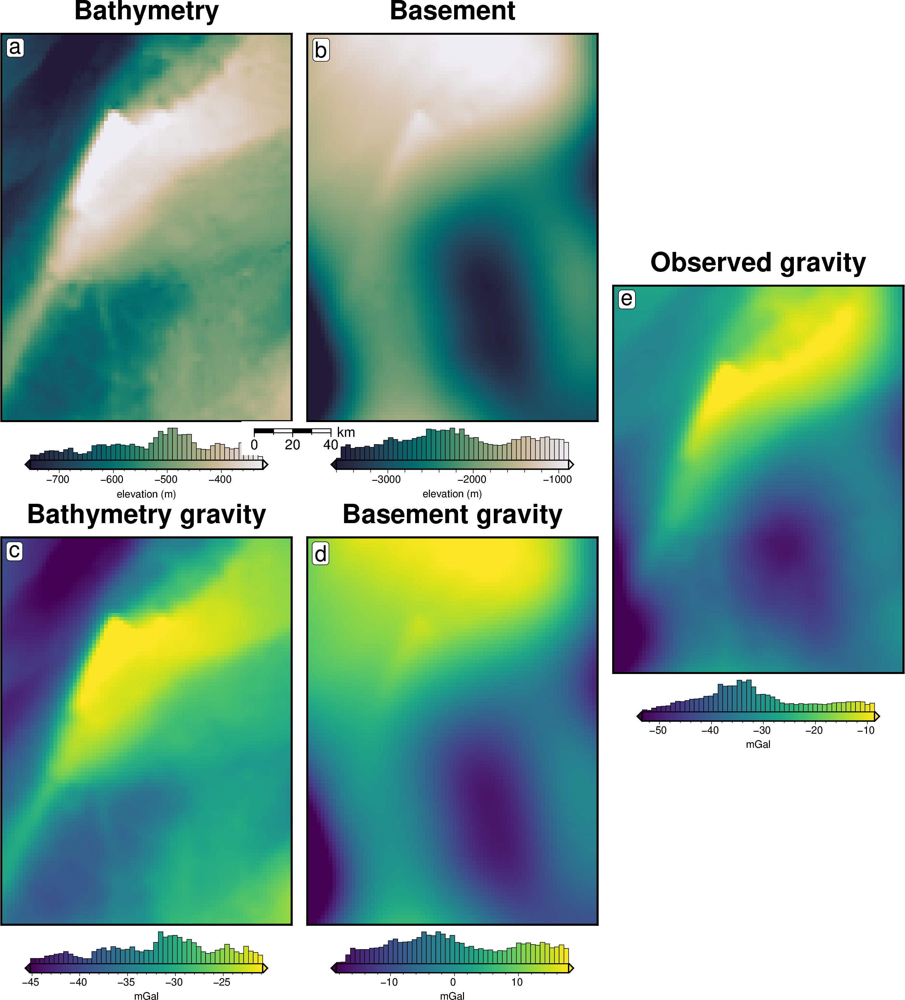

In [7]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    bathymetry,
    region=inversion_region,
    fig_height=10,
    title="Bathymetry",
    hist=True,
    cbar_yoffset=1,
    cmap="rain",
    reverse_cpt=True,
    cbar_label="elevation (m)",
    robust=True,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

fig = maps.plot_grd(
    basement,
    region=inversion_region,
    fig_height=10,
    title="Basement",
    hist=True,
    cbar_yoffset=1,
    cmap="rain",
    reverse_cpt=True,
    cbar_label="elevation (m)",
    fig=fig,
    origin_shift="xshift",
    robust=True,
    # frame=["nSEw", "xaf10000", "yaf10000"],
    scalebar=True,
    scale_position="n-.05/-.03",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# shift down and 3 to the left
fig = maps.plot_grd(
    grav_grid.bathymetry_grav,
    region=inversion_region,
    fig_height=10,
    title="Bathymetry gravity",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
    fig=fig,
    origin_shift="both",
    xshift_amount=-1,
    yshift_amount=-1,
    robust=True,
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig = maps.plot_grd(
    grav_grid.basement_grav,
    region=inversion_region,
    fig_height=10,
    title="Basement gravity",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
    fig=fig,
    origin_shift="xshift",
    robust=True,
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Observed gravity",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
    fig=fig,
    origin_shift="both",
    yshift_amount=0.5,
    robust=True,
)
fig.text(
    position="TL",
    text="e",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

fig.show()

# Make starting bathymetry model

In [8]:
# semi-regularly spaced
constraint_points = RIS_synth.constraint_layout_number(
    shape=(4, 5),
    region=inversion_region,
    padding=-spacing,
    shapefile="../../data/Ross_Sea_outline.shp",
    add_outside_points=True,
    grid_spacing=spacing,
)

# sample true topography at these points
constraint_points = utils.sample_grids(
    constraint_points,
    bathymetry,
    "true_upward",
    coord_names=("easting", "northing"),
)
constraint_points["upward"] = constraint_points.true_upward
constraint_points.head()

,northing,easting,inside,true_upward,upward
0,-1600000.0,-40000.0,False,-601.093811,-601.093811
1,-1600000.0,-38000.0,False,-609.216797,-609.216797
2,-1600000.0,-36000.0,False,-616.356018,-616.356018
3,-1600000.0,-34000.0,False,-621.262207,-621.262207
4,-1600000.0,-32000.0,False,-625.510864,-625.510864


In [9]:
# grid the sampled values using verde
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    constraints_df=constraint_points,
    dampings=None,
)

starting_bathymetry = utils.create_topography(**starting_topography_kwargs)

starting_bathymetry

<xarray.DataArray 'scalars' (northing: 121, easting: 96)> Size: 93kB
array([[-540.85324708, -544.21519109, -547.59855677, ..., -359.77829766,
        -356.84097116, -353.9671395 ],
       [-542.96903012, -546.47710941, -550.04617896, ..., -362.70499047,
        -359.76544554, -356.90451862],
       [-544.69488138, -548.33638995, -552.08554336, ..., -365.48679147,
        -362.55156299, -359.71215141],
       ...,
       [-591.97428035, -595.54194913, -599.09350427, ..., -440.93897354,
        -440.74704981, -440.46522382],
       [-590.54905826, -594.11158059, -597.66425625, ..., -440.7362303 ,
        -440.47619558, -440.129527  ],
       [-589.18119782, -592.75387759, -596.32448457, ..., -440.56111512,
        -440.22075739, -439.79986662]])
Coordinates:
  * easting   (easting) float64 768B -6e+04 -5.8e+04 ... 1.28e+05 1.3e+05
  * northing  (northing) float64 968B -1.62e+06 -1.618e+06 ... -1.38e+06
Attributes:
    metadata:  Generated by SplineCV(cv=KFold(n_splits=5, random_state=0, shu...
    damping:   None

In [10]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    starting_bathymetry,
    "starting_bathymetry",
    coord_names=("easting", "northing"),
)

constraint_points["dif"] = constraint_points.true_upward - constraint_points.starting_bathymetry
rmse = utils.rmse(constraint_points.dif)
print(f"RMSE: {rmse:.2f} m")
constraint_points

RMSE: 0.01 m


,northing,easting,inside,true_upward,upward,starting_bathymetry,dif
0,-1600000.0,-40000.0,False,-601.093811,-601.093811,-601.093811,0.000000
1,-1600000.0,-38000.0,False,-609.216797,-609.216797,-609.216797,0.000000
2,-1600000.0,-36000.0,False,-616.356018,-616.356018,-616.356018,0.000000
3,-1600000.0,-34000.0,False,-621.262207,-621.262207,-621.262207,0.000000
4,-1600000.0,-32000.0,False,-625.510864,-625.510864,-625.510864,0.000000
...,...,...,...,...,...,...,...
859,-1462000.0,87500.0,True,-441.542496,-441.542496,-441.518766,-0.023730
860,-1424000.0,-17500.0,True,-758.042567,-758.042567,-757.951472,-0.091095
861,-1424000.0,17500.0,True,-637.767397,-637.767397,-637.714910,-0.052488
862,-1424000.0,52500.0,True,-454.151180,-454.151180,-454.191936,0.040756


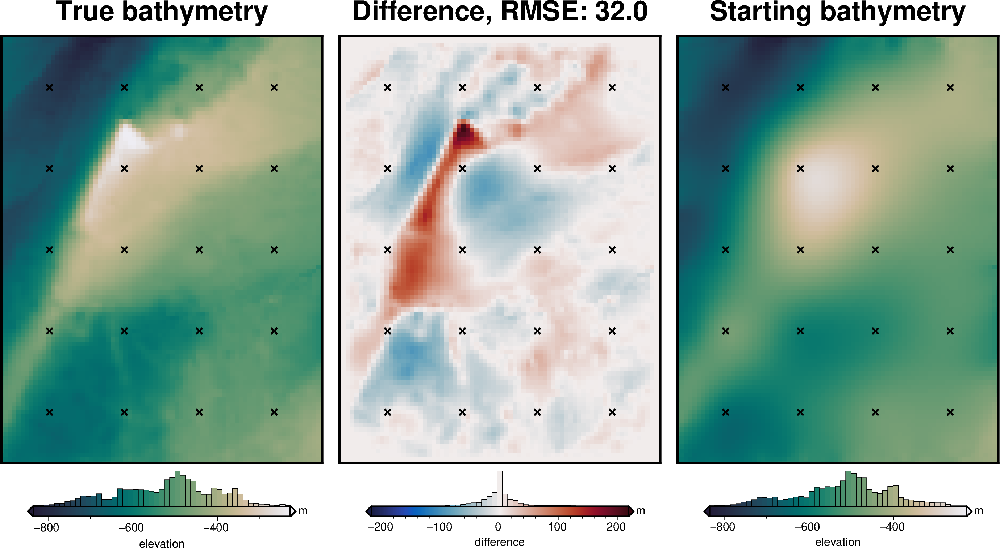

In [11]:
# compare starting and actual bathymetry grids
grids = polar_utils.grd_compare(
    bathymetry,
    starting_bathymetry,
    fig_height=10,
    plot=True,
    plot_type="pygmt",
    cmap="rain",
    reverse_cpt=True,
    diff_cmap="balance+h0",
    grid1_name="True bathymetry",
    grid2_name="Starting bathymetry",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="m",
    cbar_label="elevation",
    RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    cbar_yoffset=1,
    label_font="16p,Helvetica,black",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [12]:
# the true density contrast is 1476 kg/m3
density_contrast = 1350

# set the reference level from the prisms to 0
zref = 0

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)

# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)

grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/7676 [00:00<?, ?it/s]

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117,-32.531726
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881,-32.955392
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626,-33.336163
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479,-33.631767
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869,-33.825918
...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0.399106,4.216576,-21.543804,-23.326855
7672,-1400000.0,104000.0,1000.0,-25.911731,0.334770,2.608194,-23.303537,-23.487013
7673,-1400000.0,106000.0,1000.0,-26.033127,0.268772,0.958236,-25.074891,-23.610099
7674,-1400000.0,108000.0,1000.0,-26.122232,0.201841,-0.715051,-26.837283,-23.697322


## Regional misfit

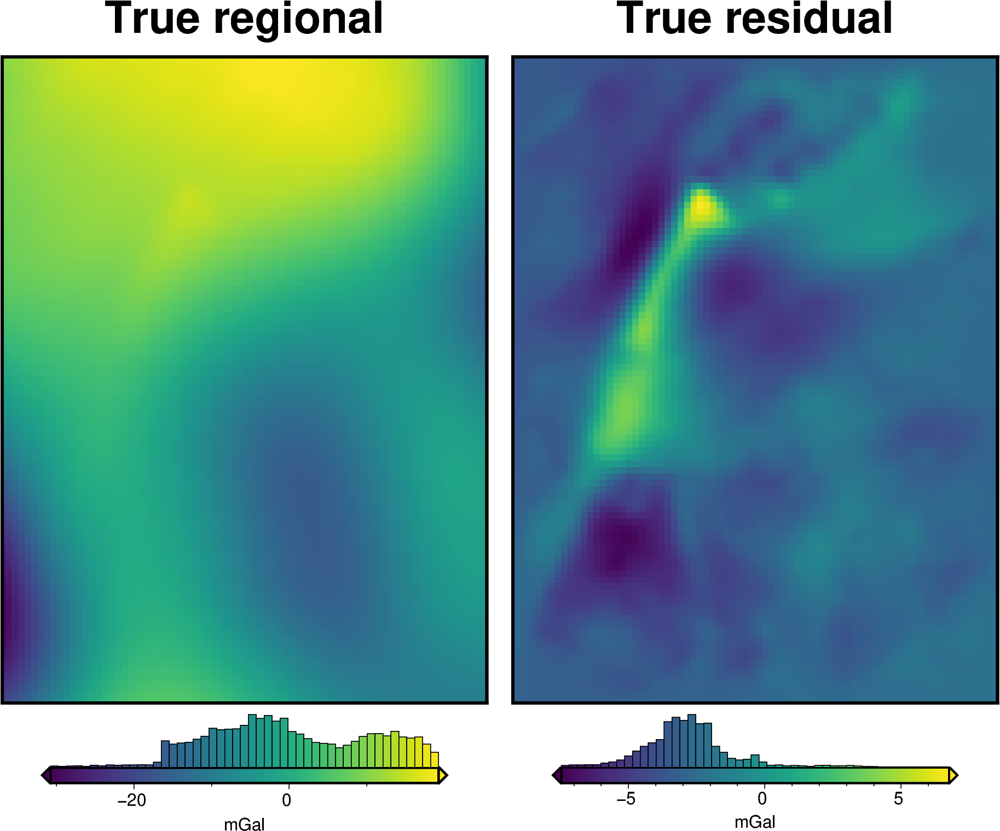

In [13]:
# calculate the true residual misfit
grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity

# grid the results
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.basement_grav,
    fig_height=10,
    title="True regional",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
)

fig = maps.plot_grd(
    grav_grid.true_res,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="True residual",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
)

fig.show()

In [14]:
def regional_comparison(df):
    # grid the results
    grav_grid = df.set_index(["northing", "easting"]).to_xarray()

    # calculate the true residual and regional misfit
    grav_grid["true_res"] = grav_grid.bathymetry_grav - grav_grid.starting_gravity
    # grav_grid["true_reg"] = grav_grid.gravity_anomaly - grav_grid.bathymetry_grav
    grav_grid["true_reg"] = grav_grid.basement_grav

    # compare with true regional
    _ = polar_utils.grd_compare(
        grav_grid.true_reg,
        grav_grid.reg,
        plot=True,
        grid1_name="True regional misfit",
        grid2_name="Regional misfit",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points,
        points_style="x.3c",
    )
    # compare with true residual
    _ = polar_utils.grd_compare(
        grav_grid.true_res,
        grav_grid.res,
        plot=True,
        grid1_name="True residual misfit",
        grid2_name="Residual misfit",
        cmap="balance+h0",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points,
        points_style="x.3c",
    )

In [15]:
# estimate regional with the mean misfit at constraints
regional_grav_kwargs = dict(
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    cv=True,
    cv_kwargs=dict(
        n_trials=40,
        # damping_limits=(1e-30, 10),
        depth_limits=(100, 400e3),
        progressbar=False,
        fname="../../tmp_outputs/Ross_Sea_06_regional_sep",
    ),
    block_size=None,
    damping=None,
)

INFO:invert4geom:using 10 startup trials


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 39
INFO:invert4geom:	parameter: {'depth': 222346.64094250885}
INFO:invert4geom:	scores: [0.9997355530609313]


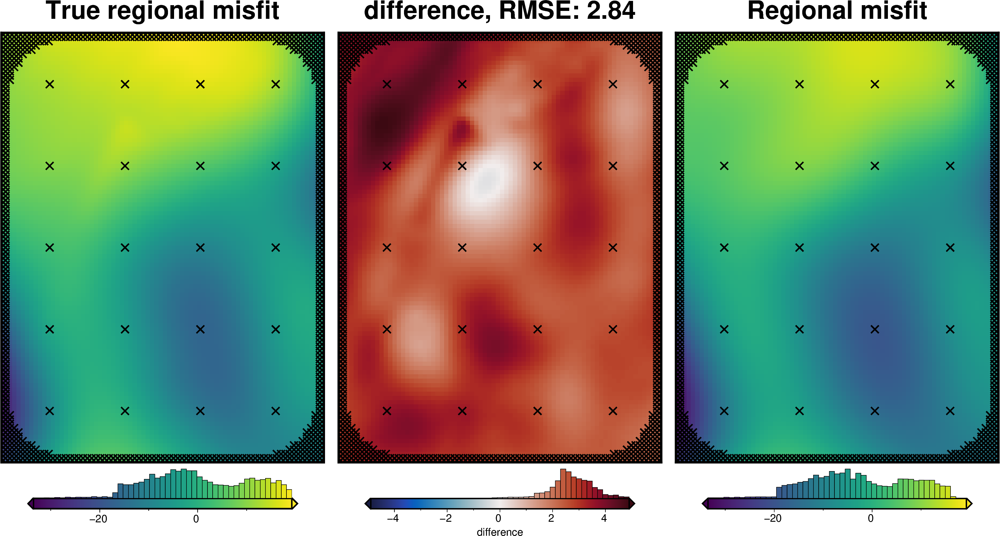

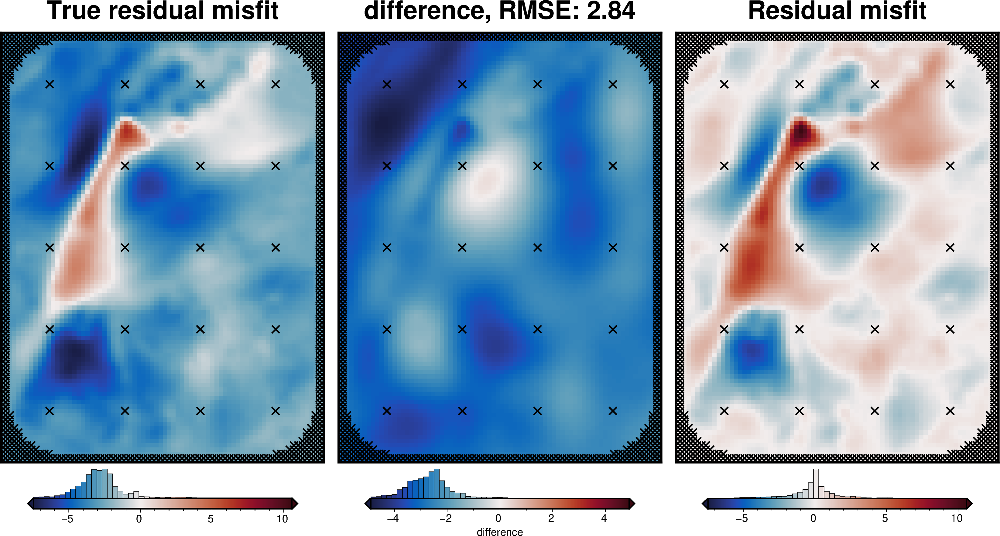

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res
count,7.676000e+03,7676.000000,7676.0,7676.000000,7676.000000,7.676000e+03,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000
mean,-1.500000e+06,35000.000000,1000.0,-31.727297,0.230443,-1.421826e-15,-31.727297,-28.926872,-2.800425,-2.800425,-2.717172,-0.083253
std,5.831332e+04,43877.680138,0.0,6.458138,0.409159,1.022896e+01,11.377662,5.602678,1.721866,10.395121,10.169023,1.830274
min,-1.600000e+06,-40000.000000,1000.0,-48.457766,-1.000000,-3.076107e+01,-61.620274,-44.484820,-7.466617,-33.544384,-33.524897,-6.279019
25%,-1.550000e+06,-2500.000000,1000.0,-36.286368,-0.074669,-7.627788e+00,-38.893491,-32.221791,-3.702754,-10.576596,-10.402198,-0.700122
50%,-1.500000e+06,35000.000000,1000.0,-31.030073,0.181261,-1.229549e+00,-33.466093,-28.407237,-2.916779,-4.813518,-3.676086,-0.022373
75%,-1.450000e+06,72500.000000,1000.0,-27.279068,0.595978,9.138373e+00,-24.669594,-25.171737,-2.133877,6.283478,6.187841,0.498186
max,-1.400000e+06,110000.000000,1000.0,-16.585801,1.000000,1.923893e+01,-2.336353,-16.075394,6.761042,21.591207,16.160812,10.571811


In [16]:
temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)

# temporarily set some kwargs
temp_reg_kwargs["cv_kwargs"]["plot"] = True
temp_reg_kwargs["cv_kwargs"]["progressbar"] = True

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **temp_reg_kwargs,
)

regional_comparison(grav_df)
grav_df.describe()

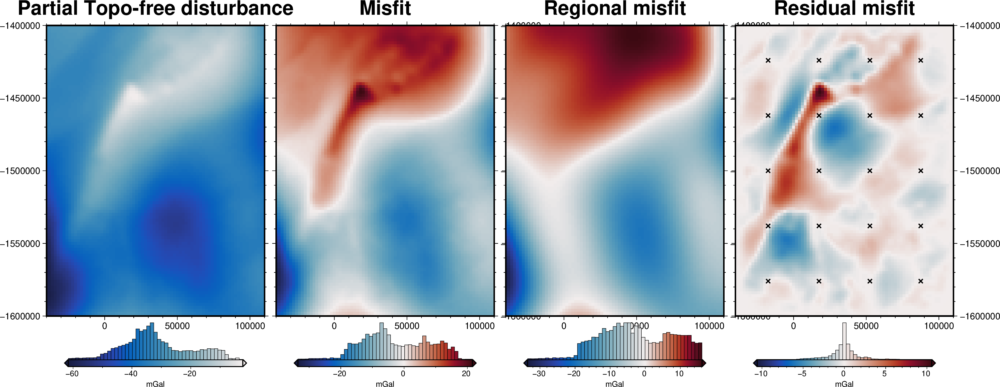

In [17]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

In [18]:
# set kwargs to pass to the inversion
kwargs = {
    # set stopping criteria
    "max_iterations": 200,
    "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
    "delta_l2_norm_tolerance": 1.008,
}

# Damping Cross Validation

In [19]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_prisms=starting_prisms,
    # for creating test/train splits
    grav_spacing=spacing,
    inversion_region=inversion_region,
    run_damping_cv=True,
    damping_limits=(0.001, 0.1),
    damping_cv_trials=8,
    # plot_cv=True,
    fname="../../results/Ross_Sea_06_damping_cv",
    **kwargs,
)

INFO:invert4geom:saving all results with root name '../../results/Ross_Sea_06_damping_cv'
INFO:invert4geom:running damping cross validation
INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 7
INFO:invert4geom:	parameter: {'damping': 0.012947768751357853}
INFO:invert4geom:	scores: [0.02032584154888075]
INFO:invert4geom:results saved to ../../results/Ross_Sea_06_damping_cv_results.pickle.pickle


: 

In [19]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_06_damping_cv_results.pickle").open(
    "rb"
) as f:
    results = pickle.load(f)

# load study
with pathlib.Path("../../results/Ross_Sea_06_damping_cv_damping_cv_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [20]:
best_damping = parameters.get("Solver damping")
kwargs["solver_damping"] = best_damping
best_damping

0.012947768751357853

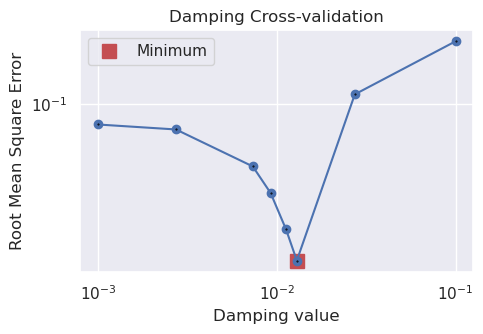

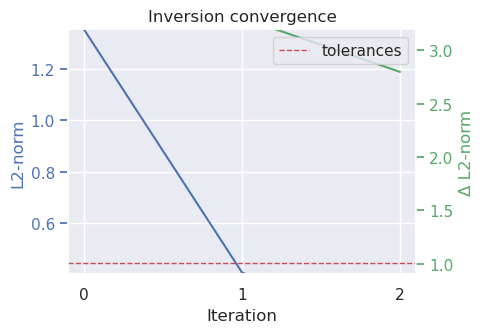

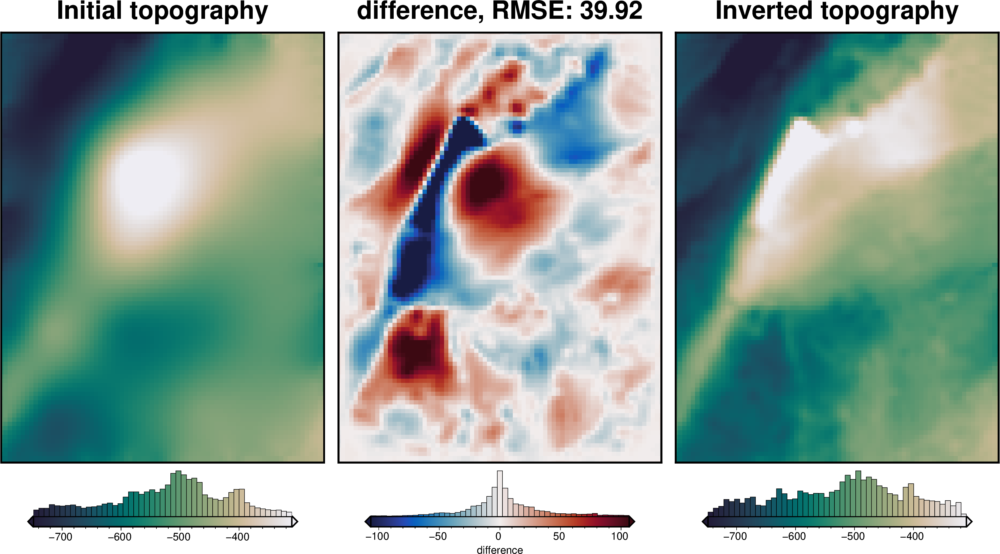

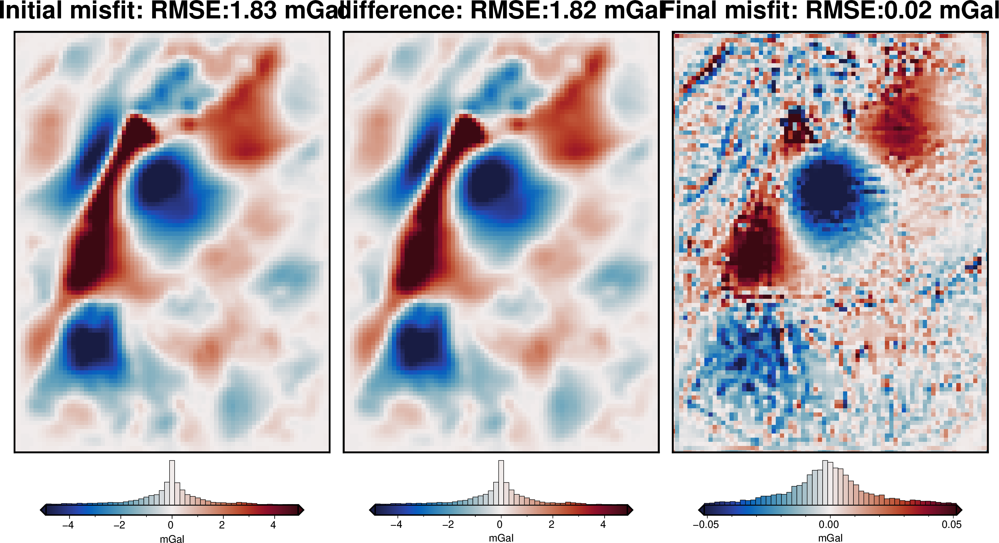

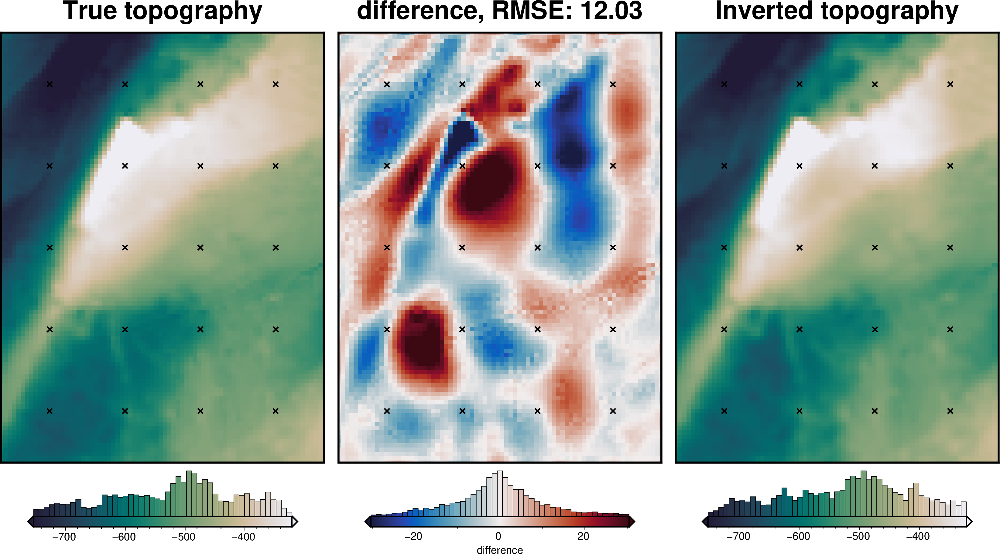

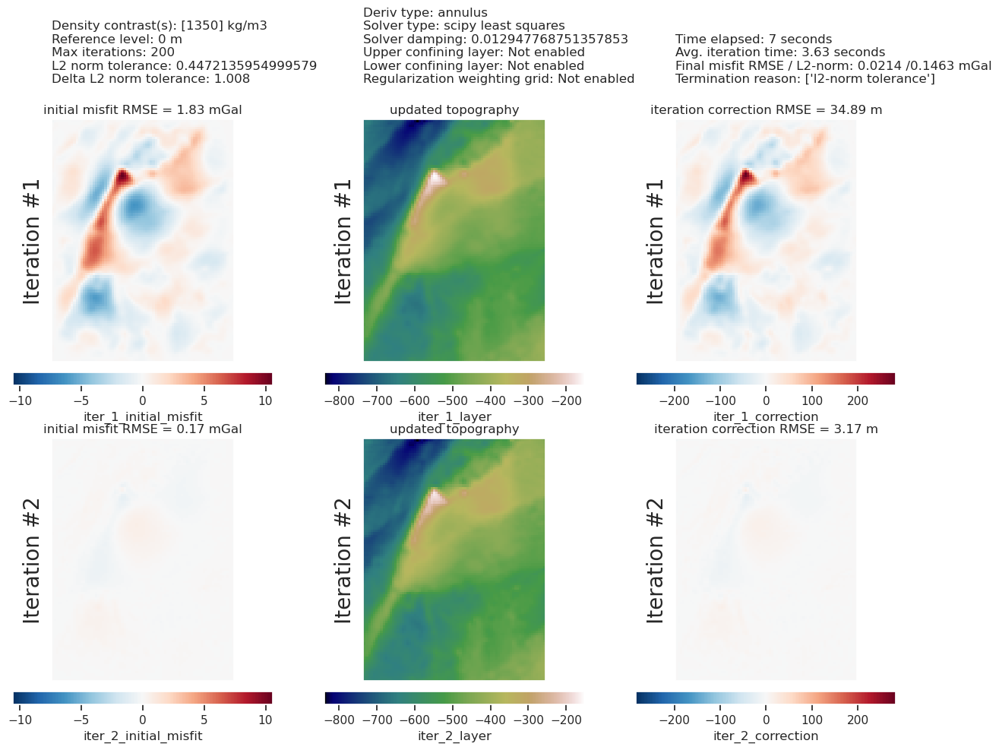

In [21]:
study_df = study.trials_dataframe()

plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)

plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [22]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 3.48 m


# Density CV

INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 1
INFO:invert4geom:	parameter: {'density_contrast': 1600}
INFO:invert4geom:	scores: [255.64205451332325]


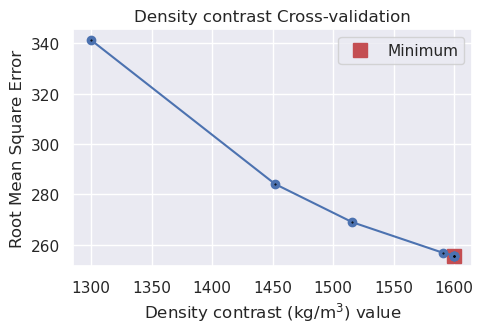

: 

In [23]:
# run the cross validation for density
study, inversion_results = optimization.optimize_inversion_zref_density_contrast(
    grav_df=grav_df,
    constraints_df=constraint_points,#[constraint_points.inside],
    density_contrast_limits=(1300, 1600),
    zref=0,
    n_trials=8,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=dict(
        method="constant",
        constant=0,
    ),
    fname="../../results/Ross_Sea_06_density_cv",
    **kwargs,
)

INFO:invert4geom:Constraints split into 4 folds
INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:starting_topography not provided, creating a starting topography model with the supplied starting_topography_kwargs


  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:starting_topography not provided, creating a starting topography model with the supplied starting_topography_kwargs
INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 2
INFO:invert4geom:	parameter: {'density_contrast': 1452}
INFO:invert4geom:	scores: [70.96374935373731]


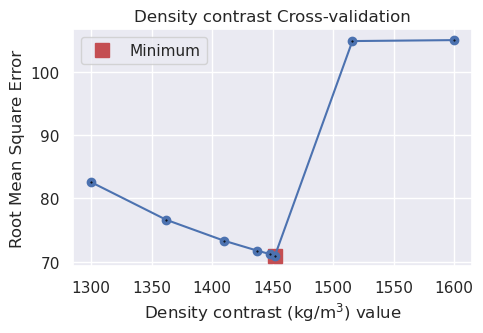

: 

In [64]:
# run a 5-fold cross validation for 10 parameter sets of density
# this performs 50 regional separations and 50 inversions
study, inversion_results = optimization.optimize_inversion_zref_density_contrast_kfolds(
    grav_df=grav_df,
    constraints_df=constraint_points[constraint_points.inside],
    density_contrast_limits=(1300, 1600),
    zref=0,
    n_trials=8,
    split_kwargs=dict(
        n_splits=4,
        method="KFold",
        # shape=(10,10),
    ),
    # score_as_median=True,
    regional_grav_kwargs=regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
    fname="../../results/Ross_Sea_06_density_cv_kfolds",
    fold_progressbar=False,
    **kwargs,
)

In [23]:
# load study from normal optimization
with pathlib.Path("../../results/Ross_Sea_06_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)
    optimized_density = study.best_params["density_contrast"]

# load study from kfold optimization
with pathlib.Path("../../results/Ross_Sea_06_density_cv_kfolds_study.pickle").open("rb") as f:
    study = pickle.load(f)
    kfold_optimized_density = study.best_params["density_contrast"]

print("optimal density contrast from normal optimization: ", optimized_density)
print("optimal density contrast from K-folds optimization: ", kfold_optimized_density)
print("real density contrast", true_density_contrast)

best_density_contrast = min([optimized_density, kfold_optimized_density], key=lambda x:abs(x-true_density_contrast))

optimal density contrast from normal optimization:  1600
optimal density contrast from K-folds optimization:  1452
real density contrast 1476


In [24]:
print("optimal determined density contrast", best_density_contrast)
print("real density contrast", true_density_contrast)
print("density error", best_density_contrast - true_density_contrast)

optimal determined density contrast 1452
real density contrast 1476
density error -24


### Redo with optimal density contrast
During the density cross-validation to avoid biasing the scores, we had to manually set a regional field. Now, with the optimal density contrast value found, we can rerun the inversion with an automatically determined regional field strength (the average value misfit at the constraints).

  0%|          | 0/7676 [00:00<?, ?it/s]

INFO:invert4geom:using 10 startup trials
INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 16
INFO:invert4geom:	parameter: {'depth': 224916.61478881325}
INFO:invert4geom:	scores: [0.999732664329343]


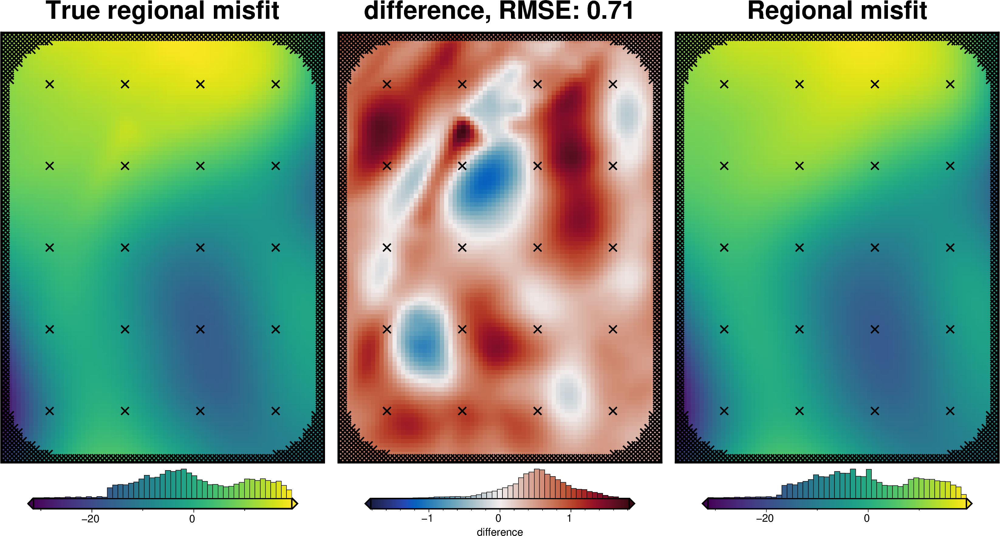

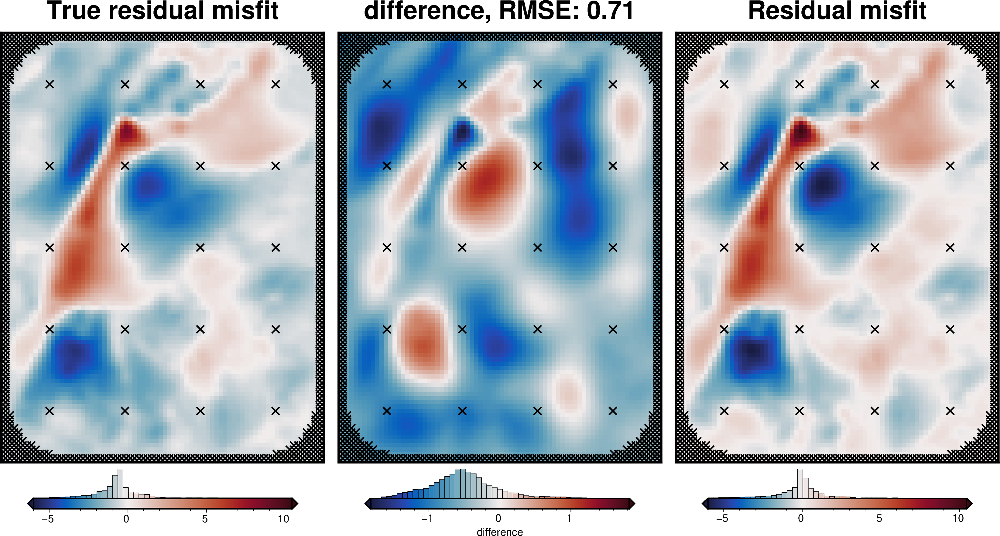

In [25]:
density_contrast = best_density_contrast

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)
# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)
grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

regional_comparison(grav_df)

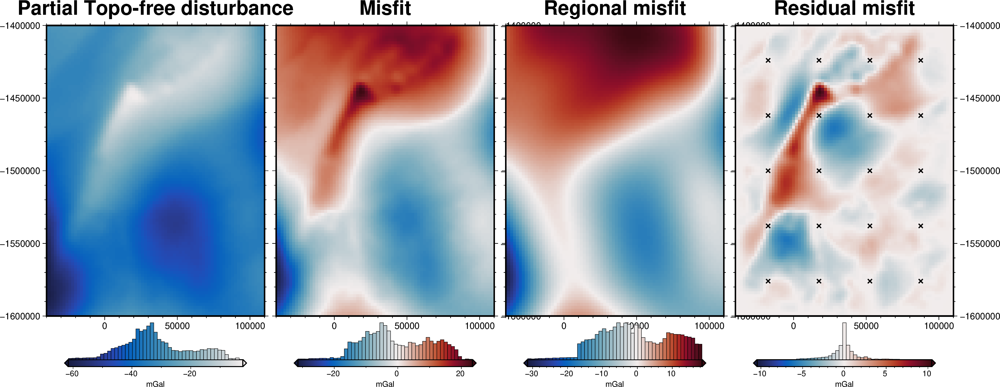

In [26]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

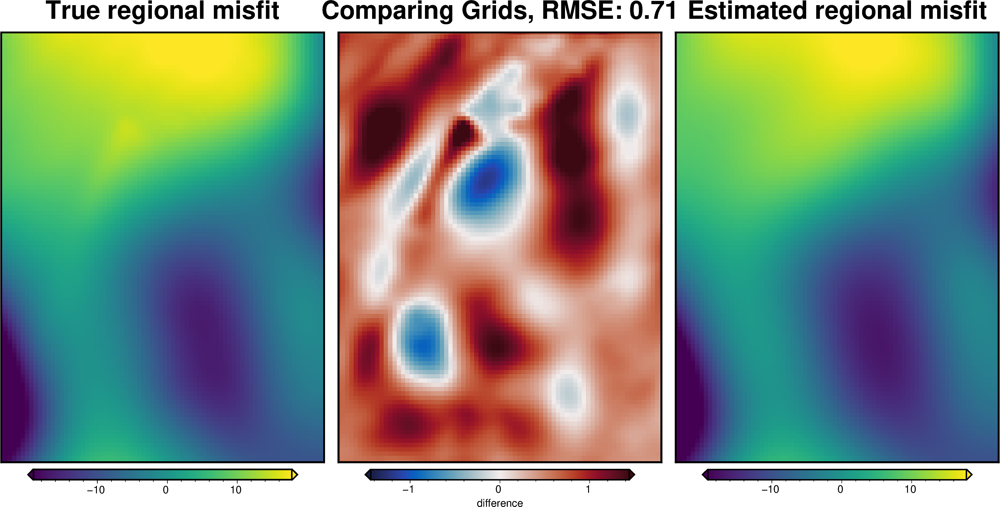

In [31]:
_ = polar_utils.grd_compare(
    grav_grid.basement_grav,
    grav_grid.reg,
    plot=True,
    inset=False,
    robust=True,
    grid1_name="True regional misfit",
    grid2_name="Estimated regional misfit",
)

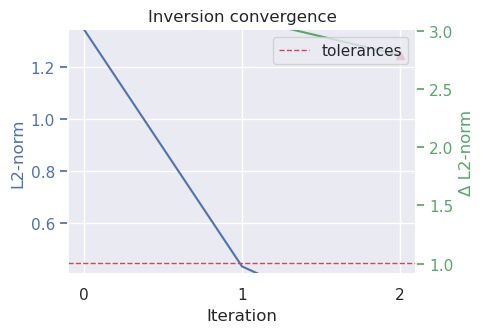

: 

In [69]:
# run the inversion workflow
inversion_results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    fname="../../results/Ross_Sea_06_optimal",
    starting_prisms=starting_prisms,
    plot_dynamic_convergence=True,
    **kwargs,
)

In [32]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_06_optimal_results.pickle").open(
    "rb"
) as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

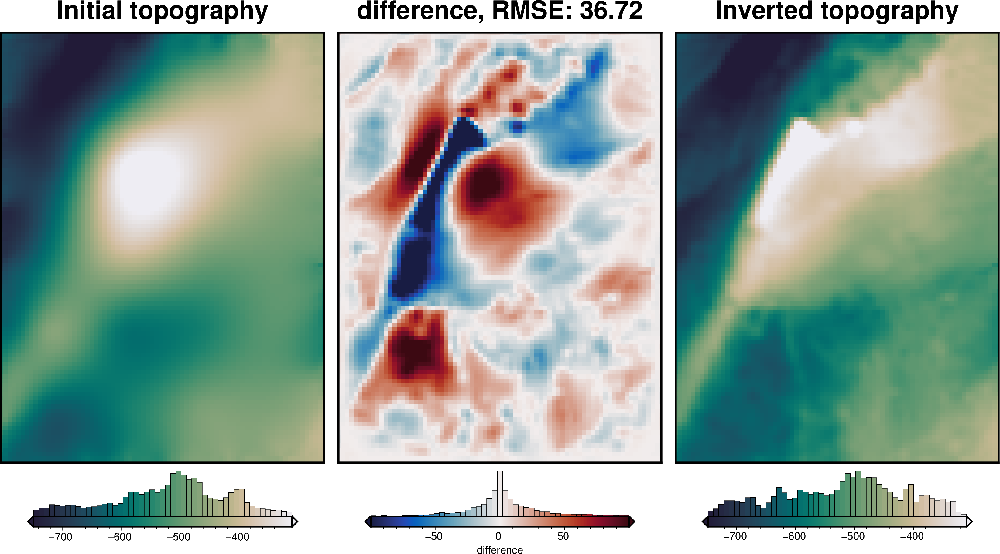

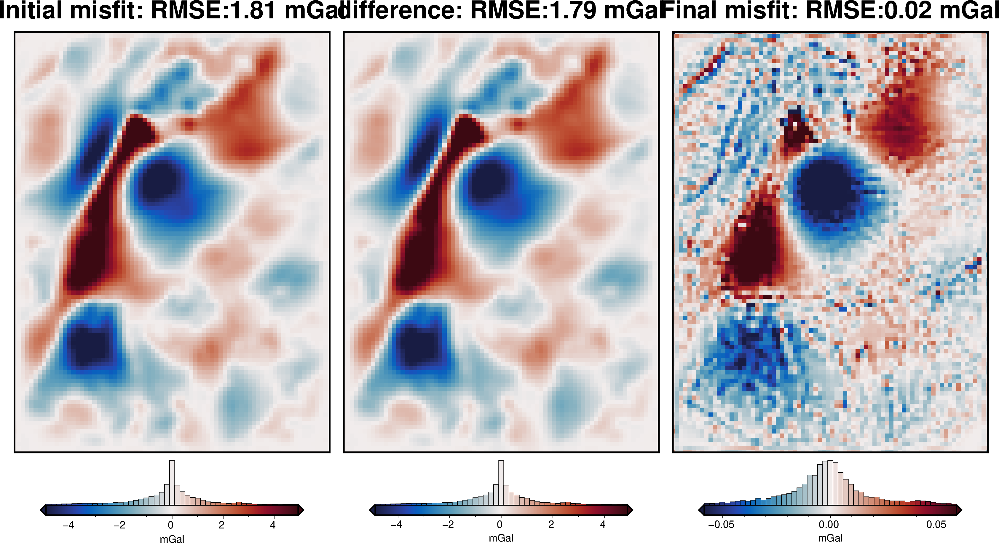

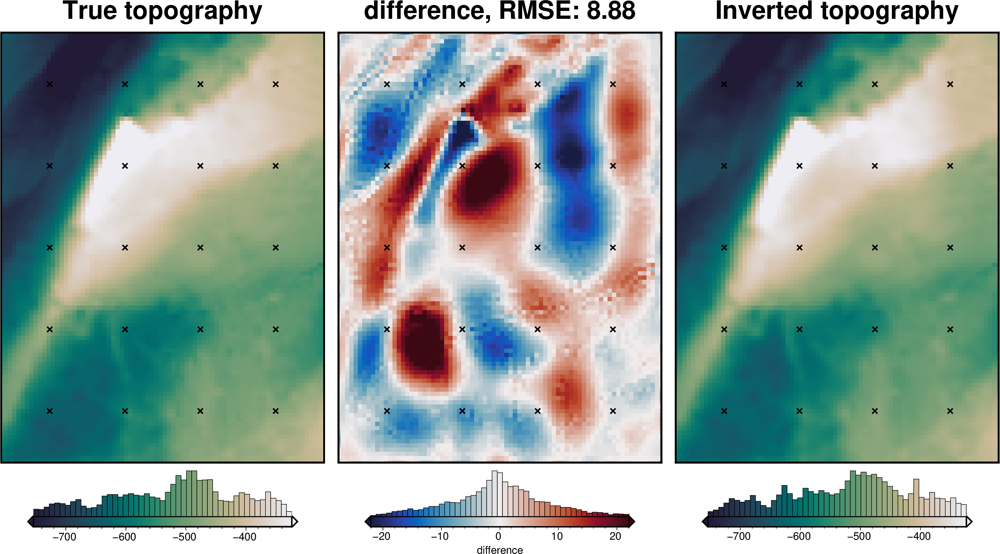

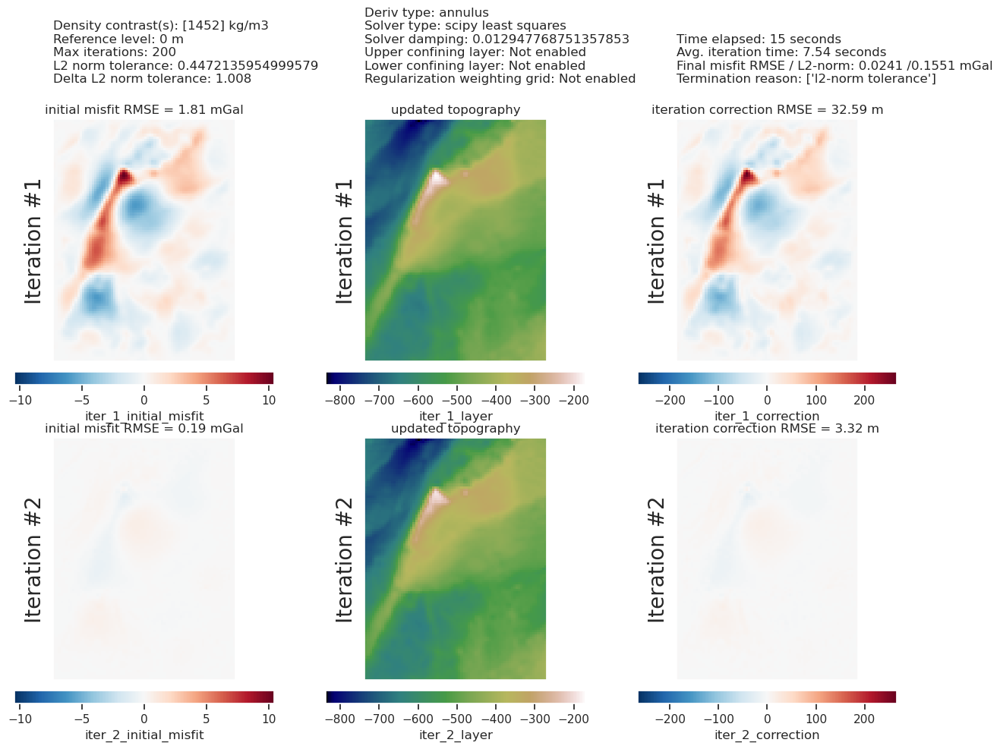

In [33]:
plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [34]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 2.83 m


In [35]:
# save to csv
constraint_points.to_csv("../../results/Ross_Sea_06_constraint_points.csv", index=False)

# Uncertainty analysis

## Inversion error

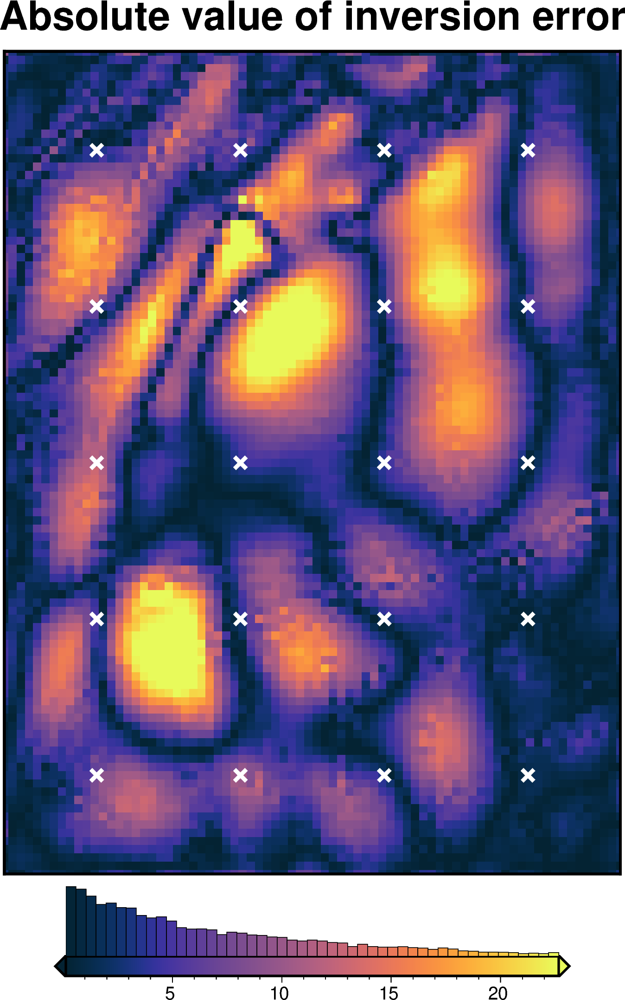

In [36]:
inversion_error = np.abs(bathymetry - final_topography)

fig = maps.plot_grd(
    inversion_error,
    # region=vd.pad_region(inversion_region, -3*spacing),
    region=inversion_region,
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points[constraint_points.inside],
    points_style="x.3c",
    points_fill="white",
    points_pen="2p",
)
fig.show()

In [37]:
# re-load the study from the saved pickle file
with pathlib.Path(f"{regional_grav_kwargs.get('cv_kwargs').get('fname')}.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)
# reg_eq_damping = min(study.best_trials, key=lambda t: t.values[0]).params["damping"]
reg_eq_depth = min(study.best_trials, key=lambda t: t.values[0]).params["depth"]

new_regional_grav_kwargs = dict(
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    damping=None,
    depth=reg_eq_depth,
    block_size=None,
)
reg_eq_depth

224916.61478881325

In [38]:
# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=new_regional_grav_kwargs,
    **kwargs,
)

## Solver damping component

In [39]:
# load study
with pathlib.Path("../../results/Ross_Sea_06_damping_cv_damping_cv_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

study_df = study.trials_dataframe().drop(columns=["user_attrs_results"])
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
stdev = np.log10(study_df2.params_damping).std()
print(f"calculated stdev: {stdev}")
stdev = stdev/4
print(f"using stdev: {stdev}")

calculated stdev: 0.47603456447149606
using stdev: 0.11900864111787401


best: 0.012947768751357853 
std: 0.11900864111787401 
+1std: 0.017029565815622472 
-1std: 0.00984433293565512


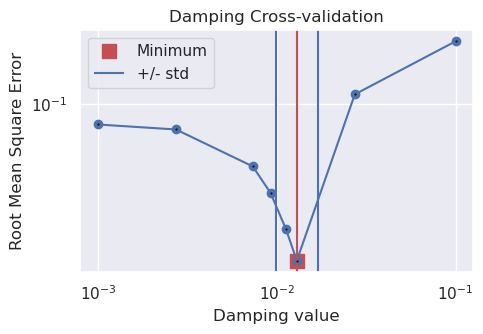

In [40]:
fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.013380787941637443, min: 0.008249794665920046, max: 0.020321077363437932
INFO:invert4geom:all 10 runs already complete, loading results from files.


stochastic ensemble: 0it [00:00, ?it/s]

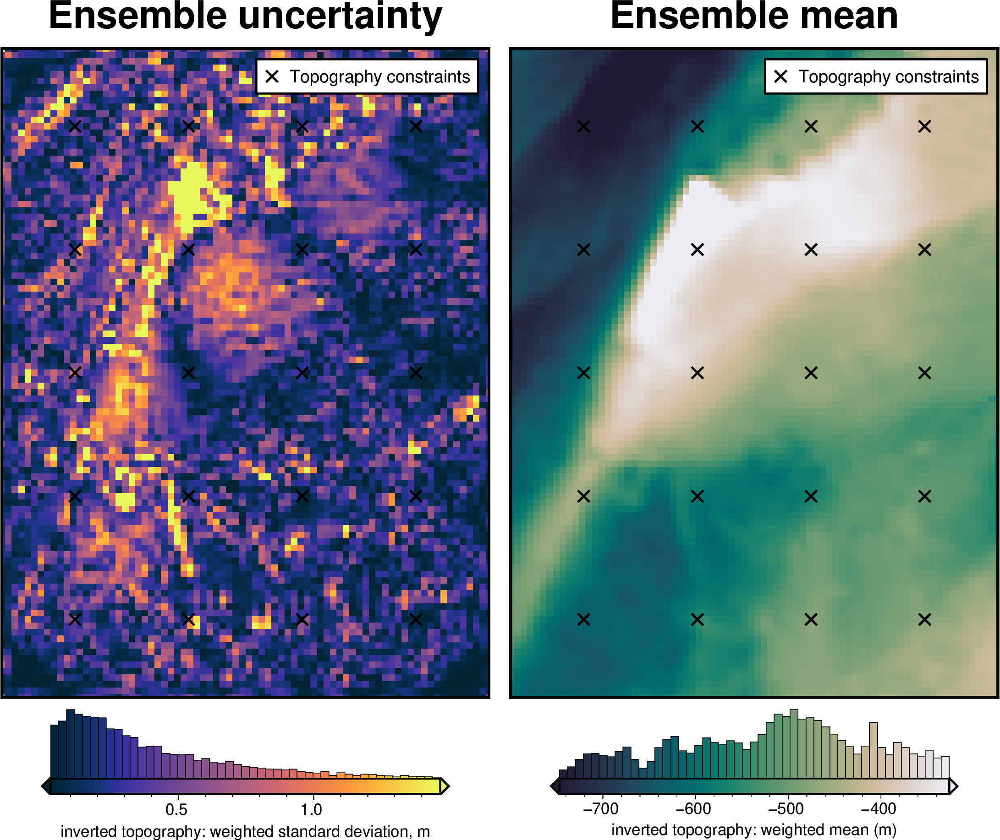

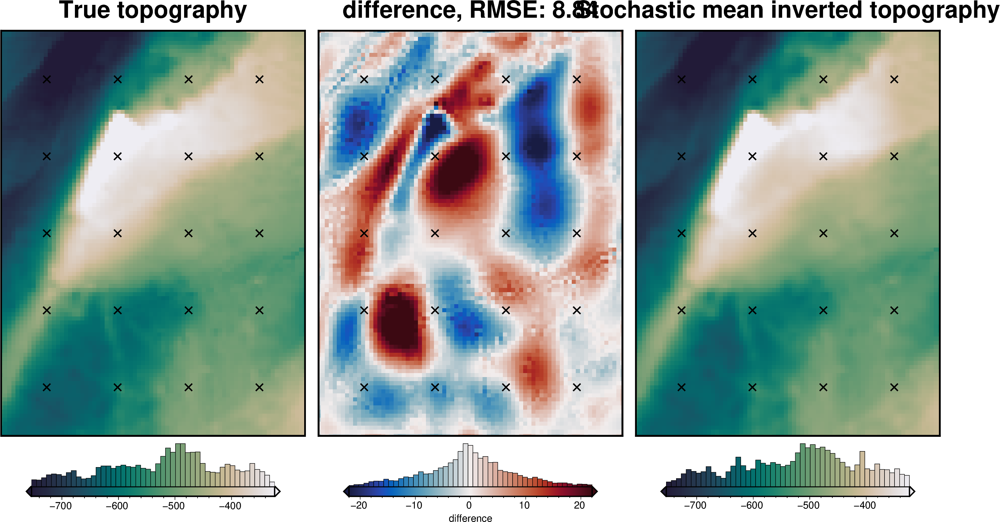

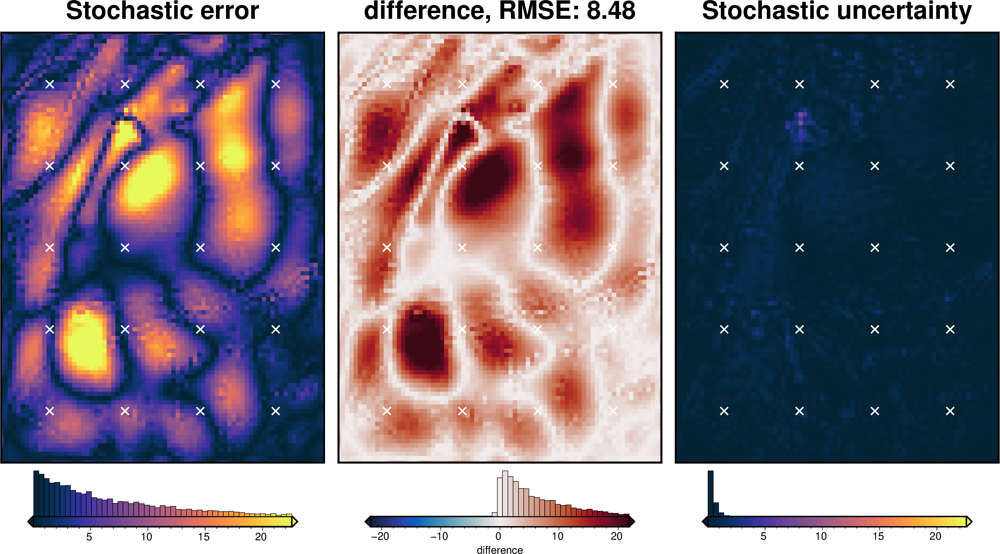

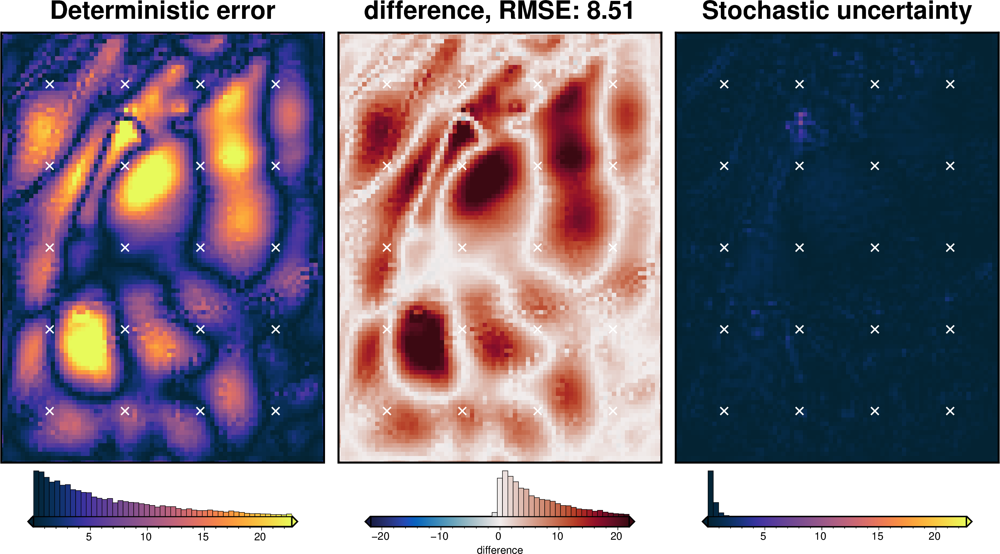

In [41]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(best_damping),  # mean of base 10 exponent
        "scale": stdev,  # 0.2,  # standard deviation of base 10 exponent
        "log": True,
    },
}
fname = "../../results/Ross_Sea_06_uncertainty_damping"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_damping_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Density component

In [62]:
# load study
with pathlib.Path("../../results/Ross_Sea_06_density_cv_kfolds_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {stdev}")

# manually pick a stdev
stdev = 60
print(f"using stdev: {stdev}")

print(f"density estimation error: {np.abs(true_density_contrast - best_density_contrast)}")

calculated stdev: 91.16223763943364
using stdev: 60
density estimation error: 24


best: 1452 
std: 60 
+1std: 1512 
-1std: 1392


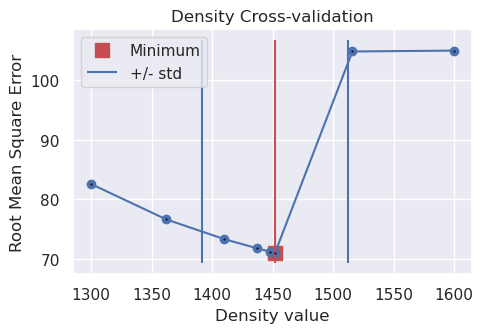

In [63]:
fig = plotting.plot_cv_scores(
    study.trials_dataframe().value.values,
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1452.0000000000002, min: 1353.3087823829117, max: 1550.6912176170883
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_06_uncertainty_density_test' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_06_uncertainty_density_test'



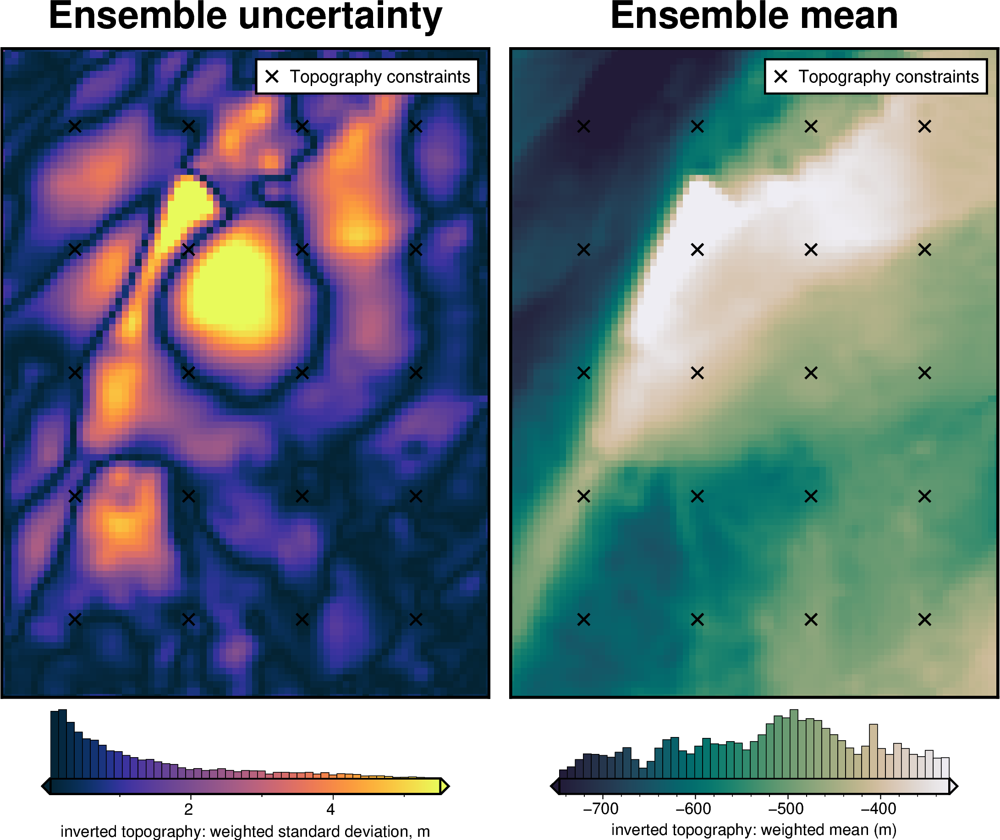

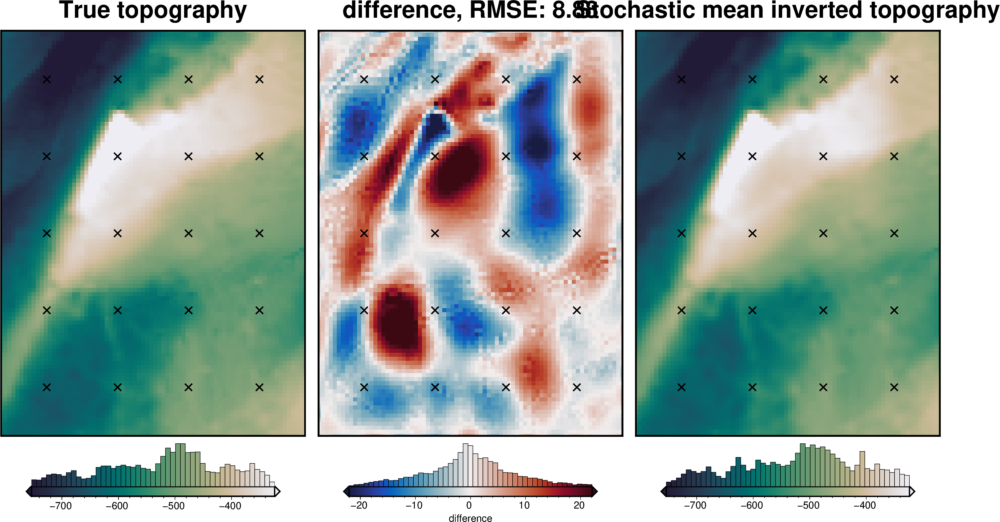

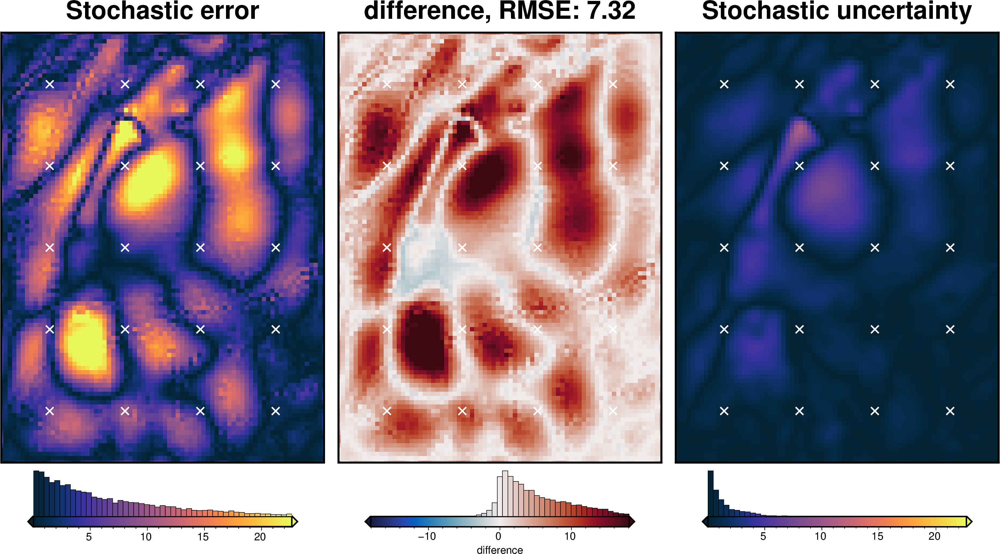

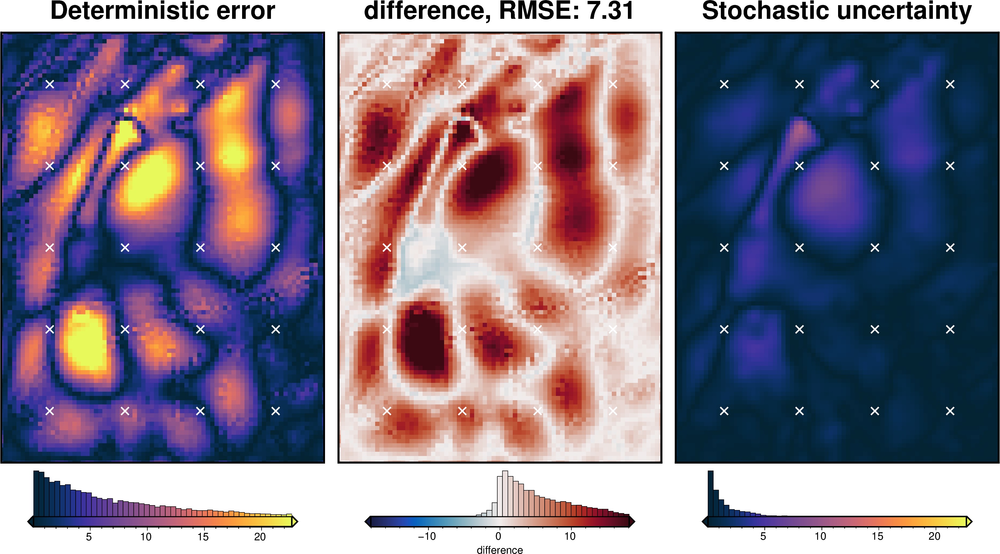

In [64]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": best_density_contrast,
        "scale": stdev,
    },
}
fname = "../../results/Ross_Sea_06_uncertainty_density_test"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_density_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Regional gravity component

In [72]:
reg_eq_depth

224916.61478881325

INFO:invert4geom:Sampled 'depth' parameter values; mean: 224916.61478881325, min: 128358.81358413905, max: 321474.41599348746


starting regional ensemble:   0%|          | 0/100 [00:00<?, ?it/s]

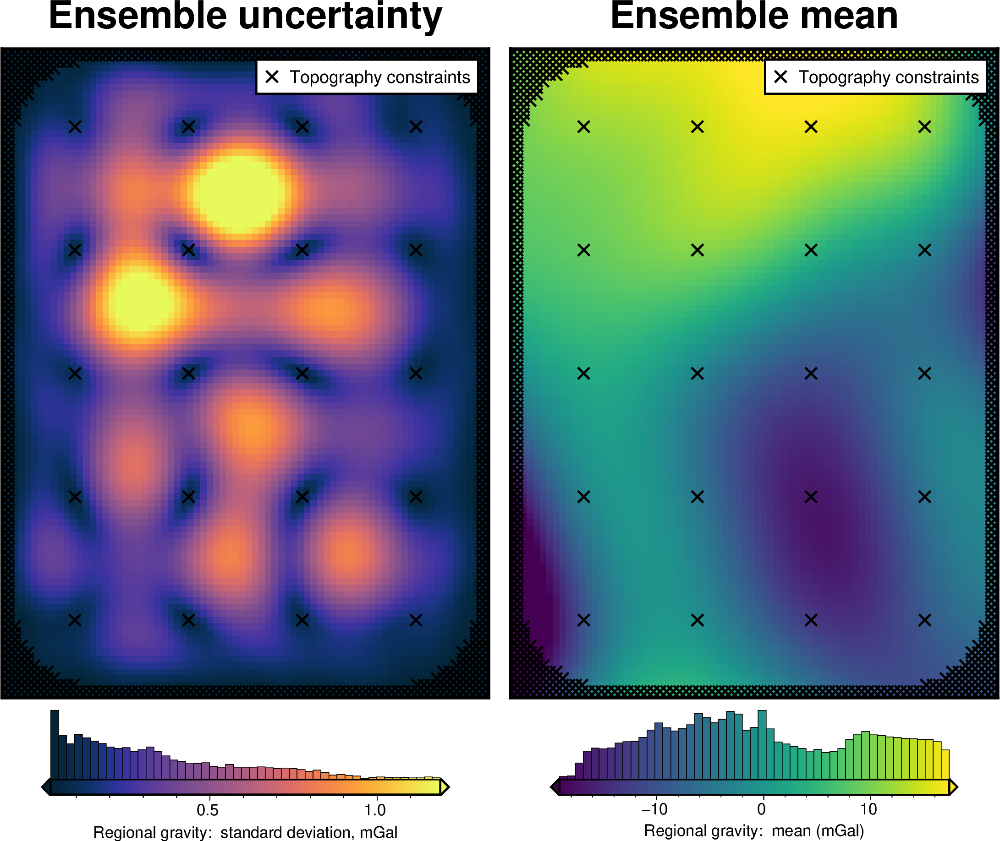

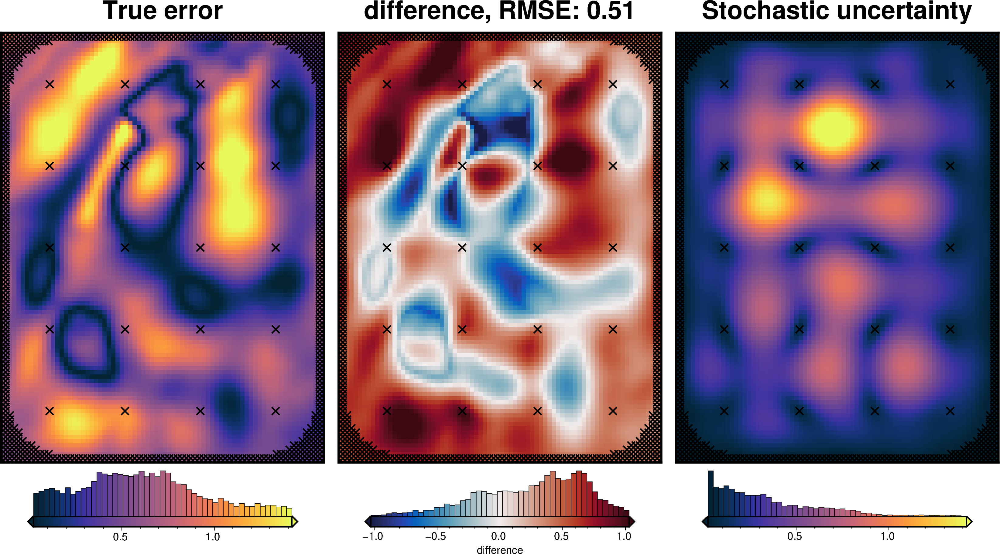

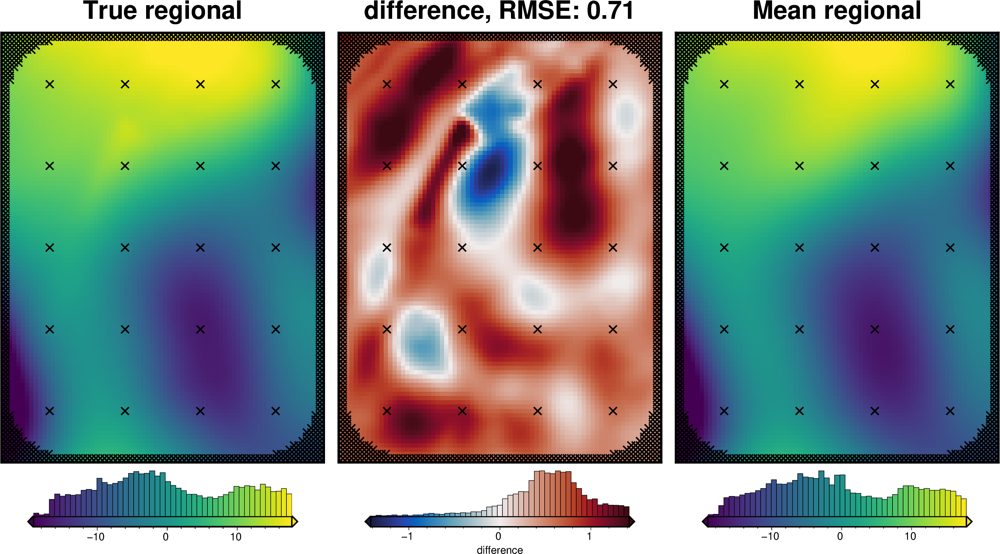

In [73]:
regional_misfit_parameter_dict = {
    "depth": {
        # "distribution": "uniform",
        # "loc": 1 * mean_constraint_distance,  # lower bound
        # "scale": 10 * mean_constraint_distance,  # range
        "distribution": "normal",
        "loc": reg_eq_depth,  # mean
        "scale": reg_eq_depth/6,  # standard deviation
    },
    # "damping": {
    #     "distribution": "normal",
    #     "loc": np.log10(reg_eq_damping),  # mean base 10 exponent
    #     "scale": 4,  # np.abs(np.log10(reg_eq_damping)),  # standard deviation of exponent
    #     "log": True,
    # },
}

regional_misfit_stats = uncertainty.regional_misfit_uncertainty(
    runs=100,
    parameter_dict=regional_misfit_parameter_dict,
    # plot_region=vd.pad_region(inversion_region, -3*spacing),
    plot_region=inversion_region,
    true_regional=grav_grid.basement_grav,
    # weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
    grav_df=grav_df,
    **new_regional_grav_kwargs,
)

In [74]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
grav_grid["reg_uncert"] = regional_misfit_stats.z_stdev
grav_df_new = vd.grid_to_table(grav_grid)
grav_df_new

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117,-34.989678,-3.019316,-20.727439,-20.769430,0.041991,0.078451
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881,-35.445355,-3.099260,-19.467526,-19.457945,-0.009581,0.044737
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626,-35.854896,-3.136985,-18.056731,-18.039210,-0.017521,0.035284
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479,-36.172834,-3.123845,-16.513645,-16.536077,0.022432,0.030862
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869,-36.381654,-3.125114,-14.929215,-14.971335,0.042120,0.025382
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0.399106,4.216576,-21.543804,-25.089328,-2.433525,3.545525,3.487536,0.057988,0.085377
7672,-1400000.0,104000.0,1000.0,-25.911731,0.334770,2.608194,-23.303537,-25.261588,-2.424717,1.958051,1.878582,0.079469,0.101247
7673,-1400000.0,106000.0,1000.0,-26.033127,0.268772,0.958236,-25.074891,-25.393973,-2.423028,0.319082,0.240712,0.078370,0.094544
7674,-1400000.0,108000.0,1000.0,-26.122232,0.201841,-0.715051,-26.837283,-25.487786,-2.424910,-1.349497,-1.377909,0.028412,0.054404


In [75]:
# save to csv
grav_df_new.to_csv("../../results/Ross_Sea_06_grav_df.csv", index=False)

In [76]:
# update grav_df
uncert_kwargs["grav_df"]=grav_df_new

INFO:invert4geom:Sampled 'depth' parameter values; mean: 224916.61478881323, min: 163257.4631893088, max: 286575.7663883177
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_06_uncertainty_regional' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_06_uncertainty_regional'



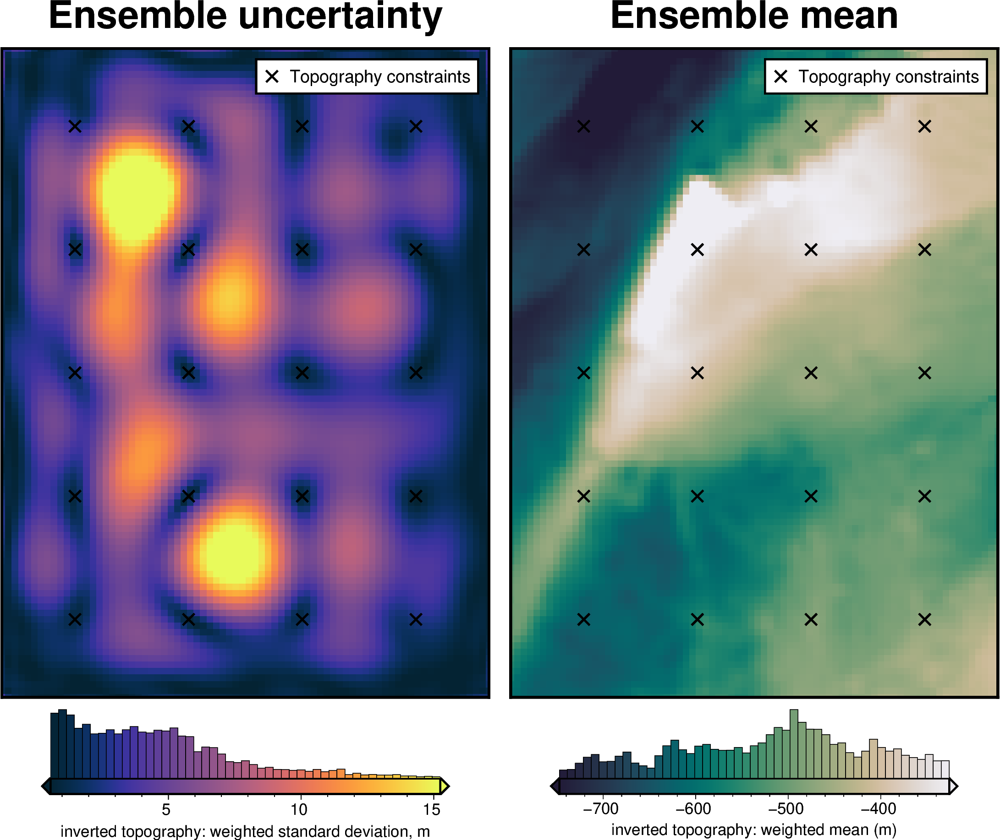

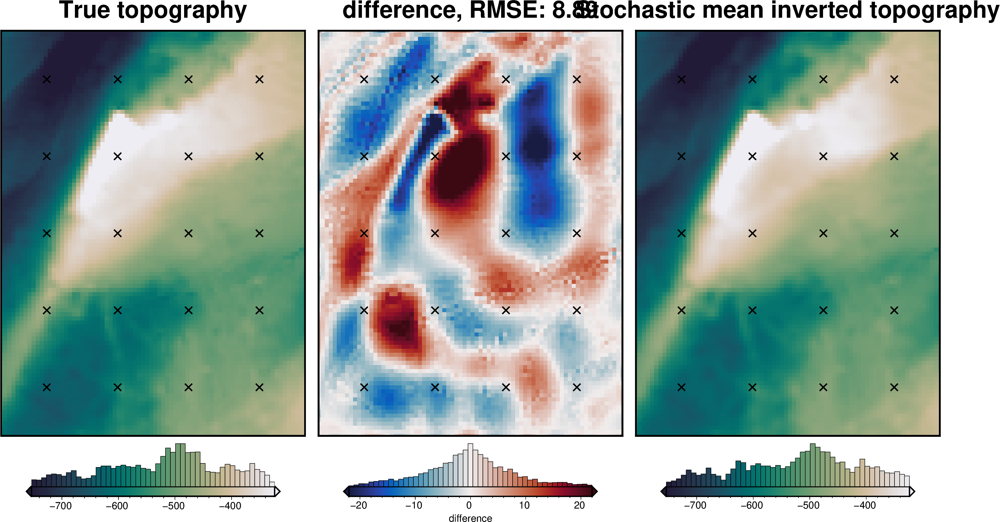

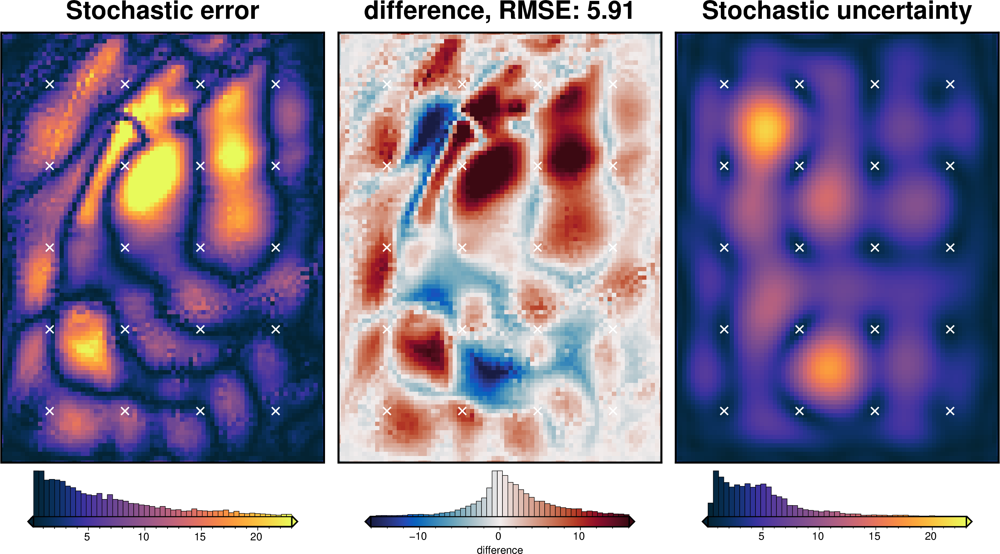

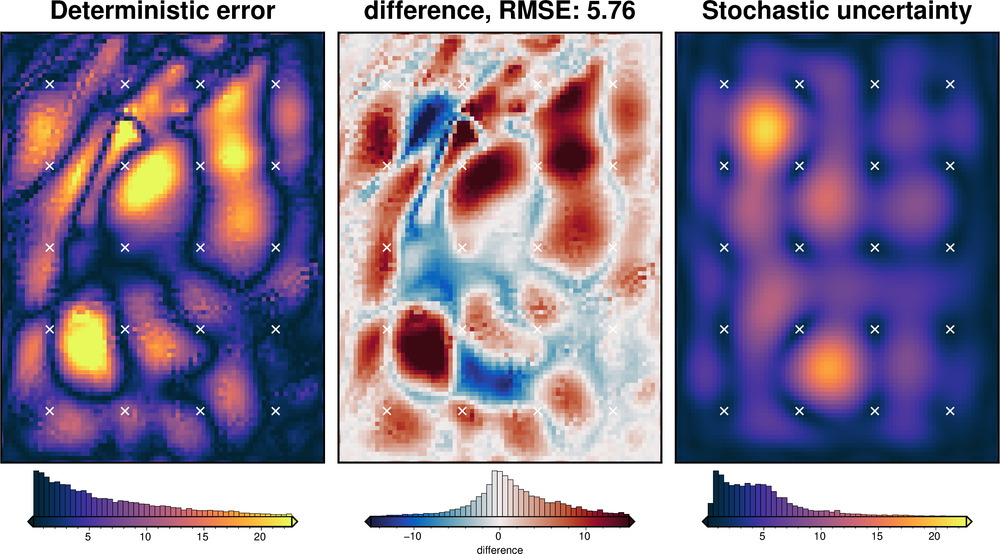

In [77]:
fname = "../../results/Ross_Sea_06_uncertainty_regional"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_regional_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    regional_misfit_parameter_dict=regional_misfit_parameter_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_regional_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Total uncertainty

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.013410797415260281, min: 0.007567323213079891, max: 0.022153767047886904
INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1452.0, min: 1334.4021609275967, max: 1569.5978390724033
INFO:invert4geom:Sampled 'depth' parameter values; mean: 224916.61478881328, min: 151445.20403702278, max: 298388.0255406038
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_06_uncertainty_full' found, creating new files



stochastic ensemble:   0%|          | 0/20 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 20
saving results to pickle files with prefix: '../../results/Ross_Sea_06_uncertainty_full'



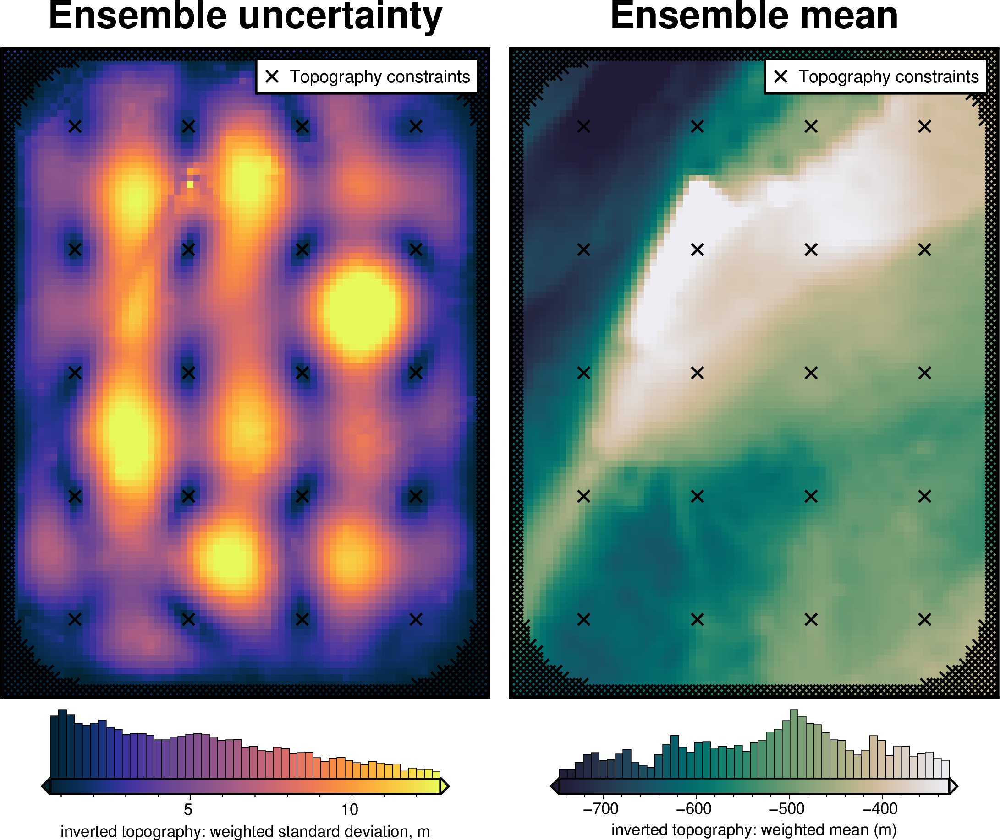

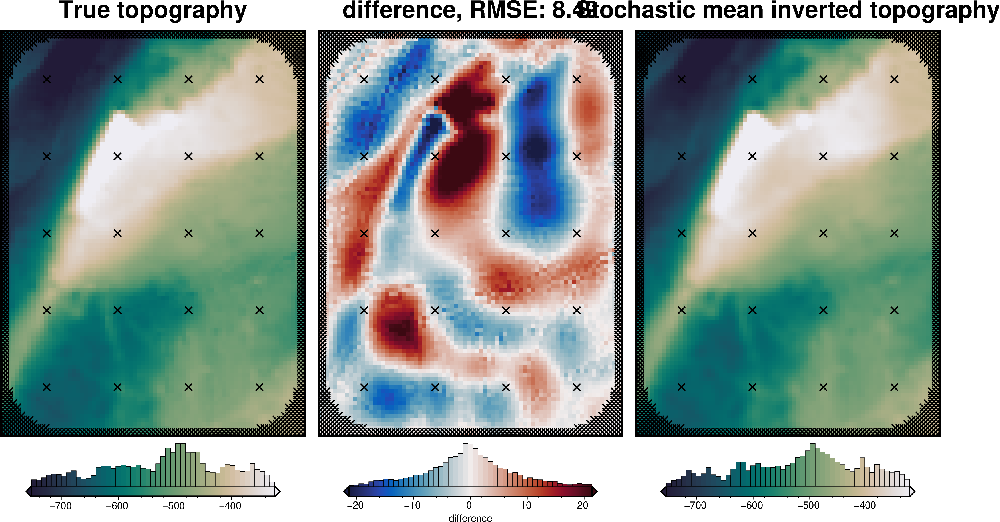

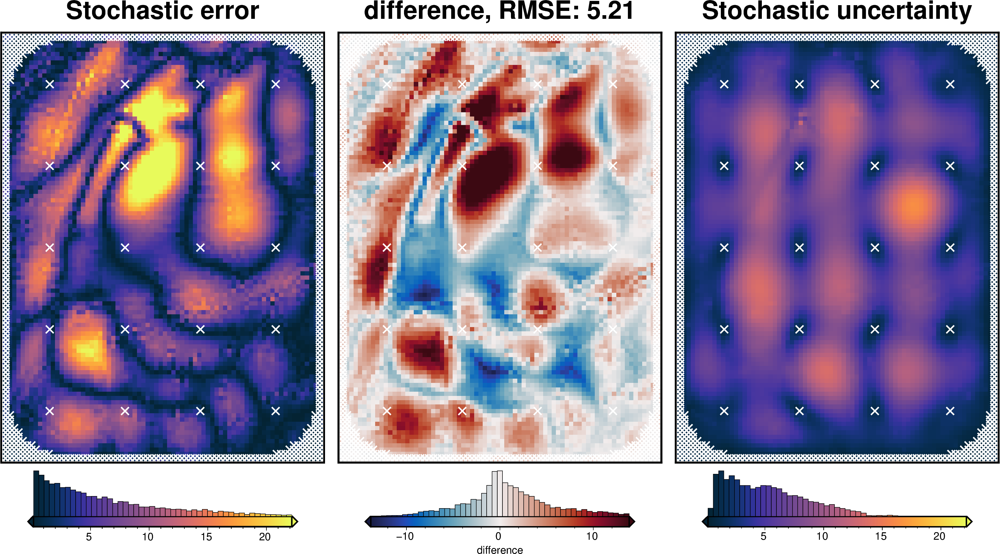

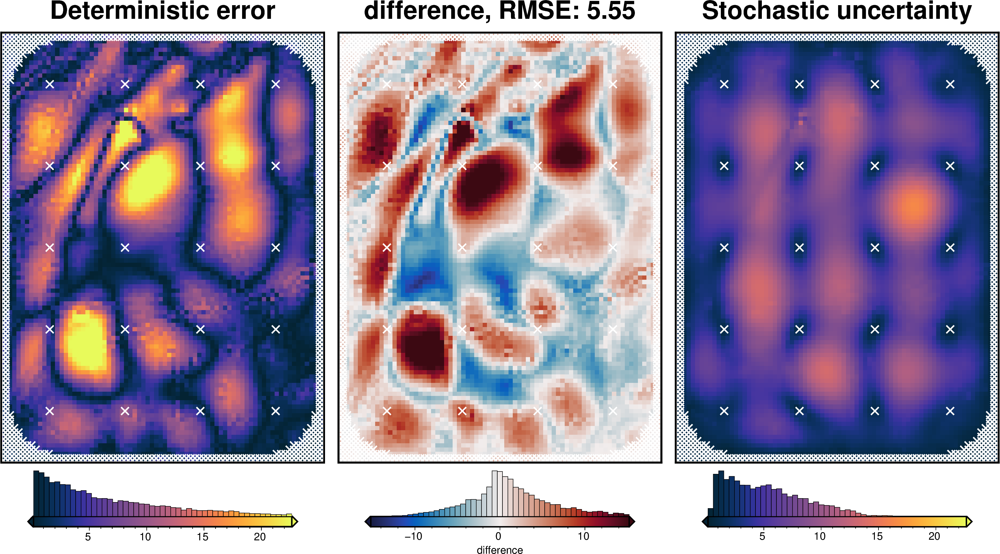

In [78]:
fname = "../../results/Ross_Sea_06_uncertainty_full"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=20,
    parameter_dict=solver_dict | density_dict,
    regional_misfit_parameter_dict=regional_misfit_parameter_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

### Comparing results

In [79]:
results = [
    uncert_results,
    uncert_regional_results,
    uncert_density_results,
    uncert_damping_results,
]

# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = uncertainty.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        # region=vd.pad_region(inversion_region, -spacing),
        region=inversion_region,
    )
    stats.append(ds)

In [80]:
names = [
    "full",
    "regional",
    "density",
    "damping",
]

# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs)
merged

<xarray.Dataset> Size: 247kB
Dimensions:         (northing: 101, easting: 76)
Coordinates:
  * northing        (northing) float64 808B -1.6e+06 -1.598e+06 ... -1.4e+06
  * easting         (easting) float64 608B -4e+04 -3.8e+04 ... 1.08e+05 1.1e+05
Data variables:
    full_stdev      (northing, easting) float64 61kB 3.194 1.789 ... 1.872 3.241
    regional_stdev  (northing, easting) float64 61kB 3.194 2.022 ... 1.747 3.171
    density_stdev   (northing, easting) float64 61kB 0.06651 0.2363 ... 0.3221
    damping_stdev   (northing, easting) float64 61kB 0.484 0.1337 ... 0.9279

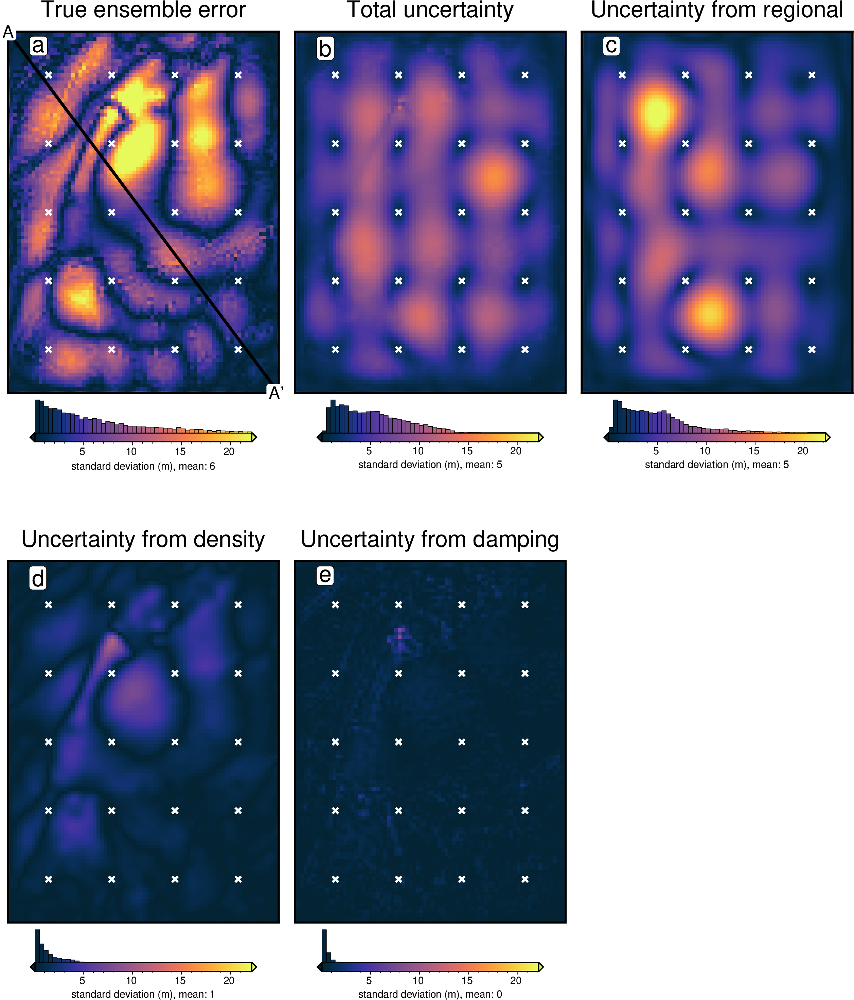

In [81]:
titles = [
    "True ensemble error",
    # "True indiv error",
    "Total uncertainty",
    "Uncertainty from regional",
    "Uncertainty from density",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

grids.insert(0, np.abs(stats[0].weighted_mean - bathymetry))

# cpt_lims = polar_utils.get_min_max(grids[0], robust=True,)
cpt_lims = polar_utils.get_combined_min_max(grids, robust=True)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
    elif i == 3:
        origin_shift = "both_shift"
        xshift_amount = -2
    else:
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        # region=vd.pad_region(inversion_region, -3*spacing),
        title=titles[i],
        title_font="16p,Helvetica,black",
        cmap="thermal",
        cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.1,
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="x.2c",
        fill="white",
        pen="1.5p,white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profiles location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

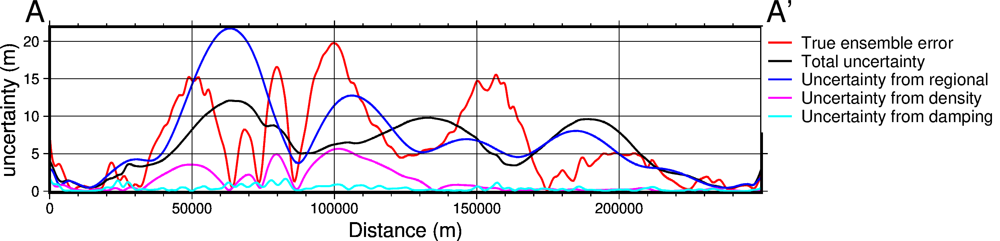

In [82]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    # data_pen_style=[None,None,"4_2:2p"],
    # data_pen_thickness=[1, 1.5, 1],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

In [83]:
# save results
merged.to_netcdf("../../results/Ross_Sea_06_sensitivity.nc")

In [84]:
stats_ds.to_netcdf("../../results/Ross_Sea_06_uncertainty.nc")